In [1]:
import numpy as np
import pandas as pd
import sklearn as sk
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
#seed = 42
from sklearn.metrics import recall_score,precision_score
from sklearn.preprocessing import scale
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix,auc, roc_curve
from sklearn import metrics 
import xgboost as xgb
from sklearn.metrics import accuracy_score#,plot_confusion_matrix
from sklearn import metrics 
import statsmodels.api as sm
import scipy
import imblearn
from imblearn.under_sampling import CondensedNearestNeighbour
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import precision_recall_curve
pd.set_option('display.max_columns', 500) # default is 20
pd.set_option('display.max_rows',None)
from sklearn import feature_selection
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.model_selection import KFold, cross_val_score

#from sklearn.utils import indexable, _safe_indexing

In [2]:
data=pd.read_excel('C:/Users/John/Documents/Business mathematics/Capstone Project/data/Correlation_Dataset_modified.xlsx')

In [3]:
data['ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ'] = pd.to_numeric(data['ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ'],errors='coerce')

In [4]:
data.head()

,ΕΠΩΝΥΜΙΑ ΠΑΚΕΤΟΥ,ΤΥΠΟΣ ΤΙΜΟΛΟΓΙΟΥ,ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ,ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ,ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ,ΚΑΤΑΣΤΑΣΗ ΤΙΜΟΛΟΓΙΟΥ,ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ,ΤΙΜΟΛΟΓΗΘΕΝ ΠΟΣΟ,ΥΠΟΛΟΙΠΟ ΕΝΕΡΓΕΙΑΣ,ΑΠΟ ΗΜΕΡΟΜΗΝΙΑ,ΕΩΣ ΗΜΕΡΟΜΗΝΙΑ,ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ,ΚΑΤΑΝΑΛΩΣΗ ΝΥΧΤΑΣ,ΠΑΓΙΟ ΗΜΕΡΑΣ,ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ,ΧΡΕΩΣΗ ΗΜΕΡΑΣ,ΠΑΓΙΟ ΝΥΧΤΑΣ,ΤΙΜΗ ΜΟΝΑΔΟΣ ΝΥΧΤΑΣ,ΑΠΟ ΕΚΚΑΘΑΡΙΣΗΣ,ΕΩΣ ΕΚΚΑΘΑΡΙΣΗΣ,ΗΜΕΡΕΣ ΕΚΚΑΘΑΡΙΣΗΣ,ΤΕΛΙΚΟΣ,ΣΥΝΟΛΙΚΟ ΠΟΣΟ,ΠΟΣΟ ΠΡΟ ΕΚΠΤΩΣΗΣ,ΠΟΣΟ ΕΚΠΤΩΣΗΣ,ΠΟΣΟ ΕΓΓΥΗΣΗΣ,ΑΞΙΑ ΕΝΑΝΤΙ,ΡΗΤΡΑ ΟΤΣ,ΛΟΙΠΕΣ ΧΡΕΩΣΕΙΣ,CLAWBACK,ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ,ΚΑΤΑΣΤΑΣΗ ΑΠΟΠΛΗΡΩΜΗΣ,ΤΕΛΕΥΤΑΙΑ ΗΜΕΡΟΜΗΝΙΑ ΠΛΗΡΩΜΗΣ,ΕΠΩΝΥΜΙΑ ΔΗΜΟΥ,ΣΥΝΕΡΓΑΤΗΣ,PhysAddrStreetNumber,PhysAddrPostalCode,PhysAddrPrefecture,ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ ΣΥΜΒΟΛΑΙΟΥ,ΣΥΝΟΛΟ ΕΝΕΡΓΕΙΑΣ,ΣΥΝΟΛΟ ΡΥΘΜΙΖΟΜΕΝΩΝ,ΣΥΝΟΛΟ ΛΟΓΑΡΙΑΣΜΟΥ,ΕΙΝΑΙ ΝΥΧΤΕΡΙΝΟ,DTM2,ΠΟΣΟ ΔΙΑΚΑΝΟΝΙΣΜΟΥ,ΠΛΗΡΩΤΕΟ,ΠΡΟΗΓΟΥΜΕΝΟ ΑΝΕΞΟΦΛΗΤΟ,ΕΠΩΝΥΜΙΑ_2,ΠΑΡΟΧΗ_2
0,p-1,ΕΚΚΑΘΑΡΙΣΤΙΚΟΣ,2014-09-16,2014-10-10 00:00:00.000,PAID,INVOICED,0.0,157.82,0.0,2014-08-18 00:00:00.000,2014-08-28 00:00:00.000,102.0,28.0,0.40,0.094500,9.64,0.17,0.072143,2014-08-18 00:00:00.000,2014-08-28 00:00:00.000,10.0,0,157.82,NaN,0.00,128.0,0.0,0.0,0.0,0.0,-10,ONTIME,2014-09-30,ΔΗΜΟΣ ΑΓ ΠΑΡΑΣΚΕΥΗΣ,partner_1,30,15343.0,ΑΤΤΙΚΗΣ,2016-01-16 00:00:00.000,12.23,7.69,157.82,1,104.0,0.0,157.82,0.00,3289,c91ac0e192c4f275f24e16373d717ad3
1,p-1,ΕΝΑΝΤΙ,2014-10-17,2014-11-10 00:00:00.000,PAID,INVOICED,0.0,36.87,0.0,2014-08-28 00:00:00.000,2014-09-28 00:00:00.000,145.0,0.0,0.00,0.094500,13.70,0.00,0.000000,NaN,NaN,NaN,0,36.87,NaN,0.00,0.0,0.0,0.0,0.0,0.0,-10,ONTIME,2014-10-31,ΔΗΜΟΣ ΑΓ ΠΑΡΑΣΚΕΥΗΣ,partner_1,30,15343.0,ΑΤΤΙΚΗΣ,2016-01-16 00:00:00.000,13.70,0.00,36.87,1,104.0,0.0,36.87,0.00,3289,c91ac0e192c4f275f24e16373d717ad3
2,p-1,ΕΚΚΑΘΑΡΙΣΤΙΚΟΣ,2014-11-18,2014-12-12 00:00:00.000,PAID,INVOICED,0.0,-40.02,0.0,2014-08-28 00:00:00.000,2014-10-19 00:00:00.000,371.0,102.0,2.08,0.093208,34.58,0.87,0.070000,2014-08-28 00:00:00.000,2014-10-19 00:00:00.000,52.0,0,-40.02,2.95,1.47,-128.0,13.7,0.0,0.0,0.0,2709,-,2014-11-18,ΔΗΜΟΣ ΑΓ ΠΑΡΑΣΚΕΥΗΣ,partner_1,30,15343.0,ΑΤΤΙΚΗΣ,2016-01-16 00:00:00.000,29.50,28.74,-40.02,1,104.0,0.0,-40.02,0.00,3289,c91ac0e192c4f275f24e16373d717ad3
3,p-1,ΕΝΑΝΤΙ,2014-12-17,2015-01-12 00:00:00.000,PAID,INVOICED,0.0,31.89,0.0,2014-10-19 00:00:00.000,2014-11-19 00:00:00.000,168.0,0.0,0.00,0.088100,14.80,0.00,0.000000,NaN,NaN,NaN,0,31.89,NaN,0.00,0.0,0.0,0.0,0.0,0.0,-55,ONTIME,2014-11-18,ΔΗΜΟΣ ΑΓ ΠΑΡΑΣΚΕΥΗΣ,partner_1,30,15343.0,ΑΤΤΙΚΗΣ,2016-01-16 00:00:00.000,14.80,0.00,31.89,1,104.0,0.0,-8.13,-40.02,3289,c91ac0e192c4f275f24e16373d717ad3
4,p-1,ΕΝΑΝΤΙ,2015-01-19,2015-02-12 00:00:00.000,PAID,INVOICED,0.0,102.34,0.0,2014-12-02 00:00:00.000,2015-01-02 00:00:00.000,228.0,0.0,0.00,0.090800,20.70,0.00,0.000000,NaN,NaN,NaN,0,102.34,NaN,0.00,62.3,0.0,0.0,0.0,0.0,-3,ONTIME,2015-02-09,ΔΗΜΟΣ ΦΥΛΗΣ,partner_1,2,13341.0,ΑΤΤΙΚΗΣ,2021-07-16 00:00:00.000,20.70,0.00,102.34,1,130.0,0.0,102.34,0.00,1838,09d1e6d064c70d194c7612ec004b0c02


Dates are being imported incorrectly as objects so we fix this.

In [5]:
data['ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ']=pd.to_datetime(data['ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ'],format='%Y %m %d')
data['ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ']=pd.to_datetime(data['ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ'],format='%Y %m %d')
data['ΑΠΟ ΗΜΕΡΟΜΗΝΙΑ']=pd.to_datetime(data['ΑΠΟ ΗΜΕΡΟΜΗΝΙΑ'],format='%Y %m %d')
data['ΕΩΣ ΗΜΕΡΟΜΗΝΙΑ']=pd.to_datetime(data['ΕΩΣ ΗΜΕΡΟΜΗΝΙΑ'],format='%Y %m %d')
data['ΑΠΟ ΕΚΚΑΘΑΡΙΣΗΣ']=pd.to_datetime(data['ΑΠΟ ΕΚΚΑΘΑΡΙΣΗΣ'],format='%Y %m %d')
data['ΕΩΣ ΕΚΚΑΘΑΡΙΣΗΣ']=pd.to_datetime(data['ΕΩΣ ΕΚΚΑΘΑΡΙΣΗΣ'],format='%Y %m %d')
data['ΤΕΛΕΥΤΑΙΑ ΗΜΕΡΟΜΗΝΙΑ ΠΛΗΡΩΜΗΣ']=pd.to_datetime(data['ΤΕΛΕΥΤΑΙΑ ΗΜΕΡΟΜΗΝΙΑ ΠΛΗΡΩΜΗΣ'],format='%Y %m %d')
data['ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ ΣΥΜΒΟΛΑΙΟΥ']=pd.to_datetime(data['ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ ΣΥΜΒΟΛΑΙΟΥ'],format='%Y %m %d')

In [6]:
#print general data info such as number or entries and non-nulls
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136963 entries, 0 to 136962
Data columns (total 49 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   ΕΠΩΝΥΜΙΑ ΠΑΚΕΤΟΥ               136963 non-null  object        
 1   ΤΥΠΟΣ ΤΙΜΟΛΟΓΙΟΥ               136963 non-null  object        
 2   ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ         136963 non-null  datetime64[ns]
 3   ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ               136963 non-null  datetime64[ns]
 4   ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ             136963 non-null  object        
 5   ΚΑΤΑΣΤΑΣΗ ΤΙΜΟΛΟΓΙΟΥ           136963 non-null  object        
 6   ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ               136962 non-null  float64       
 7   ΤΙΜΟΛΟΓΗΘΕΝ ΠΟΣΟ               136963 non-null  float64       
 8   ΥΠΟΛΟΙΠΟ ΕΝΕΡΓΕΙΑΣ             136716 non-null  float64       
 9   ΑΠΟ ΗΜΕΡΟΜΗΝΙΑ                 136963 non-null  datetime64[ns]
 10  ΕΩΣ ΗΜΕΡΟΜΗΝΙΑ                 136963 non-null  datetime64[ns]
 11  

In [7]:
data.shape

(136963, 49)

In [8]:
#checking number of unique values per attribute
data.nunique()

ΕΠΩΝΥΜΙΑ ΠΑΚΕΤΟΥ                    24
ΤΥΠΟΣ ΤΙΜΟΛΟΓΙΟΥ                     5
ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ             288
ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ                   389
ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ                   3
ΚΑΤΑΣΤΑΣΗ ΤΙΜΟΛΟΓΙΟΥ                 1
ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ                  3544
ΤΙΜΟΛΟΓΗΘΕΝ ΠΟΣΟ                 28225
ΥΠΟΛΟΙΠΟ ΕΝΕΡΓΕΙΑΣ                3030
ΑΠΟ ΗΜΕΡΟΜΗΝΙΑ                    2234
ΕΩΣ ΗΜΕΡΟΜΗΝΙΑ                    2263
ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ                 3788
ΚΑΤΑΝΑΛΩΣΗ ΝΥΧΤΑΣ                 1927
ΠΑΓΙΟ ΗΜΕΡΑΣ                      2257
ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ               4003
ΧΡΕΩΣΗ ΗΜΕΡΑΣ                    12985
ΠΑΓΙΟ ΝΥΧΤΑΣ                       355
ΤΙΜΗ ΜΟΝΑΔΟΣ ΝΥΧΤΑΣ               1491
ΑΠΟ ΕΚΚΑΘΑΡΙΣΗΣ                   2128
ΕΩΣ ΕΚΚΑΘΑΡΙΣΗΣ                   2094
ΗΜΕΡΕΣ ΕΚΚΑΘΑΡΙΣΗΣ                 384
ΤΕΛΙΚΟΣ                              2
ΣΥΝΟΛΙΚΟ ΠΟΣΟ                    28227
ΠΟΣΟ ΠΡΟ ΕΚΠΤΩΣΗΣ                15594
ΠΟΣΟ ΕΚΠΤΩΣΗΣ                     8507
ΠΟΣΟ ΕΓΓΥΗΣΗΣ            

In [9]:
data.columns

Index(['ΕΠΩΝΥΜΙΑ ΠΑΚΕΤΟΥ', 'ΤΥΠΟΣ ΤΙΜΟΛΟΓΙΟΥ', 'ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ',
       'ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ', 'ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ', 'ΚΑΤΑΣΤΑΣΗ ΤΙΜΟΛΟΓΙΟΥ',
       'ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ', 'ΤΙΜΟΛΟΓΗΘΕΝ ΠΟΣΟ', 'ΥΠΟΛΟΙΠΟ ΕΝΕΡΓΕΙΑΣ',
       'ΑΠΟ ΗΜΕΡΟΜΗΝΙΑ', 'ΕΩΣ ΗΜΕΡΟΜΗΝΙΑ', 'ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ',
       'ΚΑΤΑΝΑΛΩΣΗ ΝΥΧΤΑΣ', 'ΠΑΓΙΟ ΗΜΕΡΑΣ', 'ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ',
       'ΧΡΕΩΣΗ ΗΜΕΡΑΣ', 'ΠΑΓΙΟ ΝΥΧΤΑΣ', 'ΤΙΜΗ ΜΟΝΑΔΟΣ ΝΥΧΤΑΣ',
       'ΑΠΟ ΕΚΚΑΘΑΡΙΣΗΣ', 'ΕΩΣ ΕΚΚΑΘΑΡΙΣΗΣ', 'ΗΜΕΡΕΣ ΕΚΚΑΘΑΡΙΣΗΣ', 'ΤΕΛΙΚΟΣ',
       'ΣΥΝΟΛΙΚΟ ΠΟΣΟ', 'ΠΟΣΟ ΠΡΟ ΕΚΠΤΩΣΗΣ', 'ΠΟΣΟ ΕΚΠΤΩΣΗΣ', 'ΠΟΣΟ ΕΓΓΥΗΣΗΣ',
       'ΑΞΙΑ ΕΝΑΝΤΙ', 'ΡΗΤΡΑ ΟΤΣ', 'ΛΟΙΠΕΣ ΧΡΕΩΣΕΙΣ', 'CLAWBACK',
       'ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ', 'ΚΑΤΑΣΤΑΣΗ ΑΠΟΠΛΗΡΩΜΗΣ',
       'ΤΕΛΕΥΤΑΙΑ ΗΜΕΡΟΜΗΝΙΑ ΠΛΗΡΩΜΗΣ', 'ΕΠΩΝΥΜΙΑ ΔΗΜΟΥ', 'ΣΥΝΕΡΓΑΤΗΣ',
       'PhysAddrStreetNumber', 'PhysAddrPostalCode', 'PhysAddrPrefecture',
       'ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ ΣΥΜΒΟΛΑΙΟΥ', 'ΣΥΝΟΛΟ ΕΝΕΡΓΕΙΑΣ',
       'ΣΥΝΟΛΟ ΡΥΘΜΙΖΟΜΕΝΩΝ', 'ΣΥΝΟΛΟ ΛΟΓΑΡΙΑΣΜΟΥ', 'ΕΙΝΑΙ ΝΥΧΤΕΡΙΝΟ', 'DTM2',
       'ΠΟΣΟ ΔΙΑΚΑΝΟΝΙΣΜΟΥ',

In [10]:
#checking how many rows in total have nulls
print('\n',data.isnull().any(axis=1).sum())
#apparently most rows contain nulls


 110406


In [11]:
#print the percentage of nulls per attribute
missing_percentages=data.isnull().sum().sort_values(ascending=False)/len(data)
missing_percentages

ΠΟΣΟ ΠΡΟ ΕΚΠΤΩΣΗΣ                0.774611
ΗΜΕΡΕΣ ΕΚΚΑΘΑΡΙΣΗΣ               0.693465
ΕΩΣ ΕΚΚΑΘΑΡΙΣΗΣ                  0.693465
ΑΠΟ ΕΚΚΑΘΑΡΙΣΗΣ                  0.693465
PhysAddrStreetNumber             0.052868
ΤΕΛΕΥΤΑΙΑ ΗΜΕΡΟΜΗΝΙΑ ΠΛΗΡΩΜΗΣ    0.027161
DTM2                             0.027051
ΕΠΩΝΥΜΙΑ ΔΗΜΟΥ                   0.019969
ΥΠΟΛΟΙΠΟ ΕΝΕΡΓΕΙΑΣ               0.001803
ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ ΣΥΜΒΟΛΑΙΟΥ      0.001314
PhysAddrPostalCode               0.000832
ΣΥΝΕΡΓΑΤΗΣ                       0.000219
ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ                 0.000007
ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ             0.000000
ΚΑΤΑΣΤΑΣΗ ΑΠΟΠΛΗΡΩΜΗΣ            0.000000
ΕΠΩΝΥΜΙΑ ΠΑΚΕΤΟΥ                 0.000000
PhysAddrPrefecture               0.000000
ΛΟΙΠΕΣ ΧΡΕΩΣΕΙΣ                  0.000000
ΣΥΝΟΛΟ ΕΝΕΡΓΕΙΑΣ                 0.000000
ΣΥΝΟΛΟ ΡΥΘΜΙΖΟΜΕΝΩΝ              0.000000
ΣΥΝΟΛΟ ΛΟΓΑΡΙΑΣΜΟΥ               0.000000
ΕΙΝΑΙ ΝΥΧΤΕΡΙΝΟ                  0.000000
ΠΟΣΟ ΔΙΑΚΑΝΟΝΙΣΜΟΥ               0.000000
ΠΛΗΡΩΤΕΟ                         0

Text(0.5, 1.0, 'Null percentages per attribute')

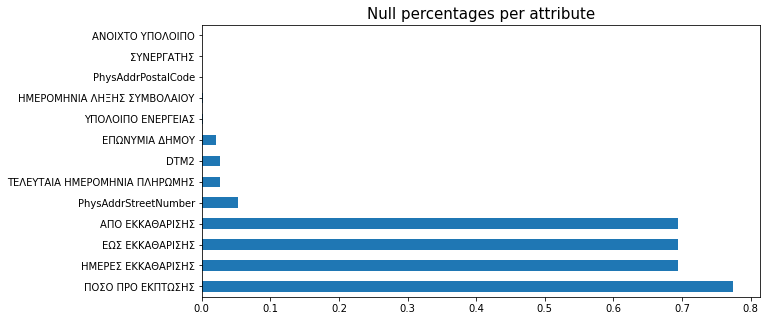

In [12]:
#the below barplot displays the attributes that contain at least one null value
missing_percentages[missing_percentages !=0].plot(figsize=(10,5),kind='barh')
plt.title('Null percentages per attribute',fontsize=15)

Numerical data description

In [13]:
#main stats of numeric attributes
data.describe()

,ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ,ΤΙΜΟΛΟΓΗΘΕΝ ΠΟΣΟ,ΥΠΟΛΟΙΠΟ ΕΝΕΡΓΕΙΑΣ,ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ,ΚΑΤΑΝΑΛΩΣΗ ΝΥΧΤΑΣ,ΠΑΓΙΟ ΗΜΕΡΑΣ,ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ,ΧΡΕΩΣΗ ΗΜΕΡΑΣ,ΠΑΓΙΟ ΝΥΧΤΑΣ,ΤΙΜΗ ΜΟΝΑΔΟΣ ΝΥΧΤΑΣ,ΗΜΕΡΕΣ ΕΚΚΑΘΑΡΙΣΗΣ,ΤΕΛΙΚΟΣ,ΣΥΝΟΛΙΚΟ ΠΟΣΟ,ΠΟΣΟ ΠΡΟ ΕΚΠΤΩΣΗΣ,ΠΟΣΟ ΕΚΠΤΩΣΗΣ,ΠΟΣΟ ΕΓΓΥΗΣΗΣ,ΑΞΙΑ ΕΝΑΝΤΙ,ΡΗΤΡΑ ΟΤΣ,ΛΟΙΠΕΣ ΧΡΕΩΣΕΙΣ,CLAWBACK,ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ,PhysAddrPostalCode,ΣΥΝΟΛΟ ΕΝΕΡΓΕΙΑΣ,ΣΥΝΟΛΟ ΡΥΘΜΙΖΟΜΕΝΩΝ,ΣΥΝΟΛΟ ΛΟΓΑΡΙΑΣΜΟΥ,ΕΙΝΑΙ ΝΥΧΤΕΡΙΝΟ,DTM2,ΠΟΣΟ ΔΙΑΚΑΝΟΝΙΣΜΟΥ,ΠΛΗΡΩΤΕΟ,ΠΡΟΗΓΟΥΜΕΝΟ ΑΝΕΞΟΦΛΗΤΟ,ΕΠΩΝΥΜΙΑ_2
count,136962.000000,136963.000000,136716.000000,136963.000000,136963.000000,136963.000000,136963.000000,136963.000000,136963.000000,136963.000000,41984.000000,136963.000000,136963.000000,3.087000e+04,136963.000000,136963.000000,136963.000000,136963.000000,136963.000000,136963.000000,136963.000000,136849.000000,136963.000000,136963.000000,136963.000000,136963.000000,133258.000000,136963.000000,136963.000000,136963.000000,136963.00000
mean,4.374895,80.287624,4.299995,503.832816,98.459153,2.682921,0.097611,49.183137,0.073867,0.035889,94.829649,0.012595,80.293742,1.311375e+11,6.856636,0.676560,23.694709,13.492995,-5.263776,0.239115,29.353198,14817.243962,36.892132,19.433843,80.293742,0.516556,93.621359,0.857313,102.671527,22.377785,2478.71623
std,56.750457,155.344964,74.506233,723.998644,285.478594,7.189893,0.016755,72.397306,0.385271,0.036447,54.425061,0.111517,155.346897,3.963635e+12,23.236789,13.902878,62.943384,71.955802,19.360186,3.901963,171.707845,3975.398646,87.568220,70.072100,155.346897,0.499728,56.315003,8.639188,200.120425,148.543682,1395.56089
min,0.000000,-2131.340000,0.000000,0.000000,0.000000,-519.770000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-2131.340000,8.000000e-02,0.000000,-790.000000,0.000000,-69.510000,-658.200000,-50.000000,-1059.000000,144.000000,-2082.440000,-178.130000,-2131.340000,0.000000,0.000000,0.000000,-5337.160000,-17702.100000,0.00000
25%,0.000000,34.960000,0.000000,203.000000,0.000000,0.000000,0.089800,18.950000,0.000000,0.000000,35.000000,0.000000,34.970000,3.316000e+01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-6.000000,12136.000000,12.660000,0.000000,34.970000,0.000000,62.000000,0.000000,36.580000,0.000000,1280.00000
50%,0.000000,55.740000,0.000000,326.000000,0.000000,0.000000,0.094300,32.090000,0.000000,0.000000,120.000000,0.000000,55.740000,6.961500e+01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14572.000000,27.710000,0.000000,55.740000,1.000000,82.000000,0.000000,60.170000,0.000000,2464.00000
75%,0.000000,88.440000,0.000000,561.000000,110.000000,1.690000,0.110280,55.250000,0.000000,0.066100,123.000000,0.000000,88.450000,1.291425e+02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,16673.000000,45.830000,15.650000,88.450000,1.000000,108.000000,0.000000,104.585000,0.000000,3686.00000
max,3984.670000,17637.180000,17637.180000,87826.000000,26905.000000,439.900000,0.500000,8281.990000,11.480000,0.500000,952.000000,1.000000,17637.180000,2.329029e+14,2425.940000,790.000000,2300.540000,7364.930000,519.760000,180.000000,2709.000000,81101.000000,9321.330000,8457.180000,17637.180000,1.000000,881.000000,619.000000,17637.180000,7779.040000,4905.00000


Some outliers can be spotted from the main stats of the numeric attributes. ΤΙΜΟΛΟΓΗΘΕΝ ΠΟΣΟ,ΠΑΓΙΟ ΗΜΕΡΑΣ, ΣΥΝΟΛΙΚΟ ΠΟΣΟ, ΠΟΣΟ ΕΓΓΥΗΣΗΣ, ΛΟΙΠΕΣ ΧΡΕΩΣΕΙΣ , ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ , ΣΥΝΟΛΟ ΕΝΕΡΓΕΙΑΣ , ΣΥΝΟΛΟ ΡΥΘΜΙΖΟΜΕΝΩΝ, ΣΥΝΟΛΟ ΛΟΓΑΡΙΑΣΜΟΥ, ΠΛΗΡΩΤΕΟ and ΠΡΟΗΓΟΥΜΕΝΟ ΑΝΕΞΟΦΛΗΤΟ all have negative outliers (most of these should not even have negative values).

Categorical data description

In [14]:
#main stats of categorical attributes
data.describe(include=[object])

,ΕΠΩΝΥΜΙΑ ΠΑΚΕΤΟΥ,ΤΥΠΟΣ ΤΙΜΟΛΟΓΙΟΥ,ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ,ΚΑΤΑΣΤΑΣΗ ΤΙΜΟΛΟΓΙΟΥ,ΚΑΤΑΣΤΑΣΗ ΑΠΟΠΛΗΡΩΜΗΣ,ΕΠΩΝΥΜΙΑ ΔΗΜΟΥ,ΣΥΝΕΡΓΑΤΗΣ,PhysAddrStreetNumber,PhysAddrPrefecture,ΠΑΡΟΧΗ_2
count,136963,136963,136963,136963,136963,134228,136933,129722,136963,136963
unique,24,5,3,1,4,92,164,450,1,4995
top,p-1,ΕΝΑΝΤΙ,PAID,INVOICED,ONTIME,ΔΗΜΟΣ ΑΘΗΝΑΙΩΝ,partner_27,3,ΑΤΤΙΚΗΣ,09d1e6d064c70d194c7612ec004b0c02
freq,66817,94735,132435,136963,104727,25221,27034,4150,136963,88


CREATING THE RESPONSE VARIABLE

First we need to do some basic data cleaning:
1)ΚΑΤΑΣΤΑΣΗ ΑΠΟΠΛΗΡΩΜΗΣ->we remove '-' and 'not expired' since they do not offer any additional information
2)ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ-> '-' is removed
3)ΤΥΠΟΣ ΤΙΜΟΛΟΓΙΟΥ->'ΑΚΥΡΩΜΕΝΟΣ','ΠΙΣΤΩΤΙΚΟΣ' are removed as well

In [15]:
data = data[data["ΚΑΤΑΣΤΑΣΗ ΑΠΟΠΛΗΡΩΜΗΣ"].str.contains("NOT EXPIRED") == False]
data = data[data["ΚΑΤΑΣΤΑΣΗ ΑΠΟΠΛΗΡΩΜΗΣ"].str.contains("-") == False]
data = data[data["ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ"].str.contains("-") == False]
data = data[data["ΤΥΠΟΣ ΤΙΜΟΛΟΓΙΟΥ"].str.contains("ΑΚΥΡΩΜΕΝΟΣ") == False]
data = data[data["ΤΥΠΟΣ ΤΙΜΟΛΟΓΙΟΥ"].str.contains("ΠΙΣΤΩΤΙΚΟΣ") == False]
data.reset_index(inplace=True)


Remove all non relevant packages.

In [16]:
data = data[data["ΕΠΩΝΥΜΙΑ ΠΑΚΕΤΟΥ"].str.contains("p-5") == False]
data = data[data["ΕΠΩΝΥΜΙΑ ΠΑΚΕΤΟΥ"].str.contains("p-8") == False]
data = data[data["ΕΠΩΝΥΜΙΑ ΠΑΚΕΤΟΥ"].str.contains("p-3") == False]
data = data[data["ΕΠΩΝΥΜΙΑ ΠΑΚΕΤΟΥ"].str.contains("p-4") == False]
data = data[data["ΕΠΩΝΥΜΙΑ ΠΑΚΕΤΟΥ"].str.contains("p-19") == False]
data = data[data["ΕΠΩΝΥΜΙΑ ΠΑΚΕΤΟΥ"].str.contains("p-20") == False]

In [17]:
data['Default Yes=1,No=0']=0


Basic assumption : default = 2 continuos unpaid bills, exit from default = 2 continuous paid bills )

In [18]:
unique_paroxes=data['ΠΑΡΟΧΗ_2']
unique_paroxes=unique_paroxes.drop_duplicates()

In [19]:
data['missed_payment']=0
data['missed_payment']=np.where(data['ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ'].str.contains('UNPAID')==True,1,0)

In [20]:
data=data.sort_values(by='ΠΑΡΟΧΗ_2')
data=data.sort_values(['ΠΑΡΟΧΗ_2', 'ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ'], ascending=[True,True])
data=data.reset_index()
data.drop(['index'],axis=1,inplace=True)
data.drop(['level_0'],axis=1,inplace=True)


Create the response variable

We iteratively check the sum of 2 rows i.e. i ( which is now) + i-1 (which is the month before). If sum=2 then the customer is in default state (2 continuous unpaid). If sum=0 then the customer state is stable meaning he either remains in default state or remains in normal state. If sum=1 then the state of the client does not change and the state will be equal to the state in which he was in.

In [21]:
 for j in unique_paroxes:#παιρνει ολες τι τιμες των μοναδικων id
  data.loc[data['ΠΑΡΟΧΗ_2']==j,'Default Yes=1,No=0']=data.loc[data['ΠΑΡΟΧΗ_2']==j,'missed_payment'].rolling(2).sum().shift(0)

Since we are using 2 rows for summing, the first row will be null. Replace nulls with 0 since every customer starts at a normal state.

In [22]:
null_loc=np.where(data['Default Yes=1,No=0'].isna())
null_loc=pd.DataFrame(null_loc)
ones_loc=np.where(data['Default Yes=1,No=0']==1)
ones_loc=pd.DataFrame(ones_loc)

In [23]:
for i in range(len(null_loc.T)):
 data.iloc[null_loc.iloc[0,i],data.columns.get_loc('Default Yes=1,No=0')]=0

In [24]:
for i in range(len(ones_loc.T)):
 data.iloc[ones_loc.iloc[0,i],data.columns.get_loc('Default Yes=1,No=0')]=data.iloc[ones_loc.iloc[0,i]-1,data.columns.get_loc('Default Yes=1,No=0')]

In [25]:
data['Default Yes=1,No=0']=np.where(data['Default Yes=1,No=0']==0,0,1)

In [26]:
defaults=data[data['Default Yes=1,No=0']==1]['ΠΑΡΟΧΗ_2'].drop_duplicates()
print('Total number of defaults is:',len(defaults))


Total number of defaults is: 405


Lets create some new features regarding the defaulters

In [27]:
data['period']=data['ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ'].dt.to_period('M')

In [28]:
data['default date']=0
for i in defaults:
   data.loc[data['ΠΑΡΟΧΗ_2']==i,'default date']=data.loc[data['ΠΑΡΟΧΗ_2']==i,'Default Yes=1,No=0'].diff()

In [29]:
data['start of default']=0
for i in defaults:
   data['start of default']=np.where(data['default date']==1,1,0)

In [30]:
data['default date']=np.where(data['default date']==1,data['period'],np.where(data['default date']==-1,data['period'],0))

Total defaults 

In [31]:
defaults=data[data['Default Yes=1,No=0']==1]['ΠΑΡΟΧΗ_2'].drop_duplicates()
print('Total number of defaults is:',len(defaults))

Total number of defaults is: 405


405 customers have defaulted at least once during their cooperation time.

How many unique clients are there?

In [32]:
unique_clients=data['ΕΠΩΝΥΜΙΑ_2'].unique()
print('number of unique clients is',len(unique_clients))

number of unique clients is 4755


Ratio of defaulters/non-defaulters

In [33]:
clients=[defaults,len(unique_clients)]
clients_percentage=[len(defaults)/len(unique_clients)*100,100-(len(defaults)/len(unique_clients)*100)]
clients_percentage=pd.DataFrame(clients_percentage)
#creating a dataframe with client default percentages
print('Default percentage is',len(defaults)/len(unique_clients)*100)

Default percentage is 8.517350157728707


No handles with labels found to put in legend.


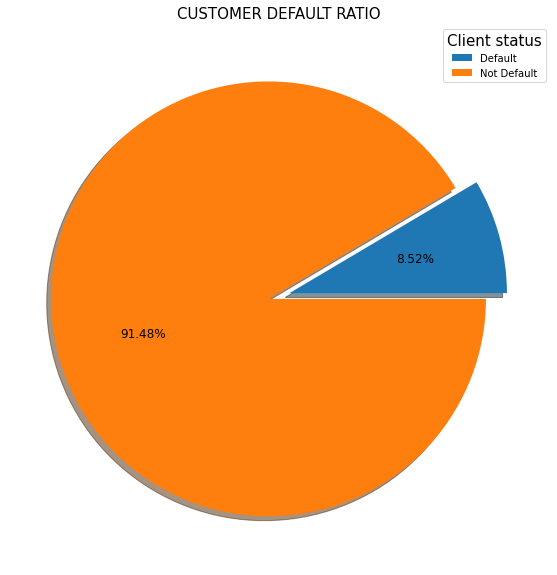

In [34]:
clients_percentage.plot(kind='pie', subplots=True, autopct='%1.2f%%', legend=True, fontsize=12, figsize=(10,10), textprops={'color':"black"},shadow=True,explode=(0.05, 0.05),labels=['',''])
plt.legend(["Default",'Not Default'],title="Client status", fontsize=10, title_fontsize=15)
plt.ylabel("")
plt.title('CUSTOMER DEFAULT RATIO',fontsize=15)
plt.show()


How many accounts are there per customer and who has the most?

In [35]:
#ο αριθμός των παροχών ανά πελάτη
paroxes=data.groupby('ΕΠΩΝΥΜΙΑ_2').nunique('ΠΑΡΟΧΗ_2')
print('Most accounts that a customer has is', paroxes['ΠΑΡΟΧΗ_2'].max())


Most accounts that a customer has is 13


Number of accounts per customer seems high

In [36]:
paroxes['ΠΑΡΟΧΗ_2'].value_counts()

1     4673
2       74
3        4
4        1
5        1
13       1
7        1
Name: ΠΑΡΟΧΗ_2, dtype: int64

4673 customers have 1 account, 74 have 2 accounts. The customers that have 13,7 and 5 accounts are probably outliers.

In [37]:
paroxes_defaults=data[data['Default Yes=1,No=0']==1].groupby('ΕΠΩΝΥΜΙΑ_2').nunique('ΠΑΡΟΧΗ_2')
print('Most accounts per defaulter is', paroxes_defaults['ΠΑΡΟΧΗ_2'].max())

Most accounts per defaulter is 1


In [38]:
#data[data['Default Yes=1,No=0']==1].drop_duplicates('ΠΑΡΟΧΗ_2')['ΕΠΩΝΥΜΙΑ_2'].value_counts().max()#sort_values(ascending=False)

Text(0.5, 1.0, 'Most Common Packages')

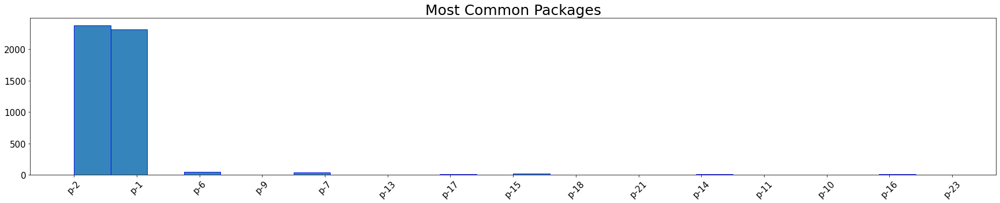

In [39]:
##most common packages
plt.xticks(rotation=45) 
paketa=data.drop_duplicates(['ΠΑΡΟΧΗ_2'])
paketa['ΠΑΡΟΧΗ_2'].nunique()
paketa['ΕΠΩΝΥΜΙΑ ΠΑΚΕΤΟΥ'].hist(figsize=(30,5), bins=24, ec="b", xlabelsize=15, ylabelsize=15, alpha=0.9, grid=False)
plt.title('Most Common Packages',fontsize=25)


Text(0.5, 1.0, 'Payment status ratio')

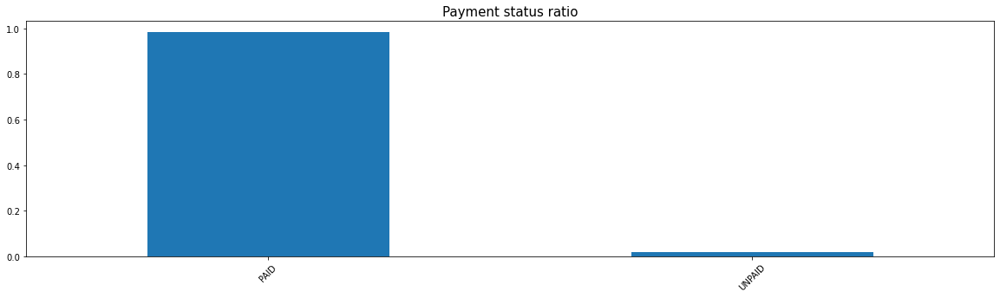

In [40]:
#percentages of payment status
(data['ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ'].value_counts() / len(data)).plot(kind='bar',figsize=(20,5))
plt.xticks(rotation=45)
plt.title('Payment status ratio',fontsize=15)

Text(0.5, 1.0, 'Ontime/Overdue Payments')

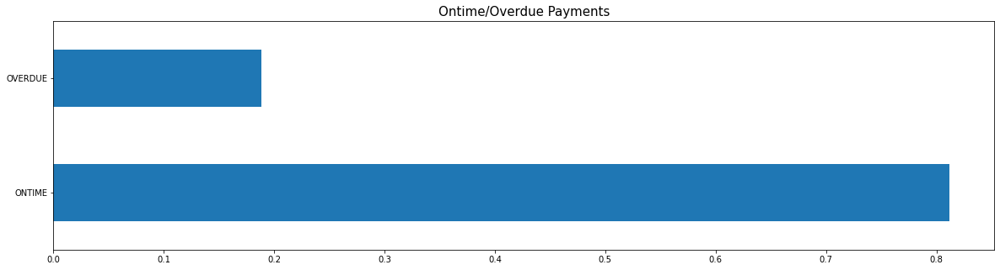

In [41]:
#barplot of the percentages of late/ontime payments
(data['ΚΑΤΑΣΤΑΣΗ ΑΠΟΠΛΗΡΩΜΗΣ'].value_counts() / len(data)).plot(kind='barh',figsize=(20,5))
plt.title('Ontime/Overdue Payments',fontsize=15)


Overdue payments over time

In [42]:
data['ΜΗΝΑΣ/ΕΤΟΣ ΛΗΞΗΣ ΤΙΜΟΛΟΓΗΣΗΣ']=data['ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ'].dt.to_period('M')

In [43]:
px.histogram(data,x='ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ',color='ΚΑΤΑΣΤΑΣΗ ΑΠΟΠΛΗΡΩΜΗΣ')

Which partners show the most cases of late payments?

In [44]:
#partners that have highest payment delay numbers
synergatis=data.groupby(['ΣΥΝΕΡΓΑΤΗΣ'])

In [45]:
#the below functions count the positive and negative occurencies of a given array
pos = lambda col : col[col > 0].count()
neg = lambda col : col[col < 0].count()
def pos(col): 
  return col[col > 0].count()

def neg(col): 
  return col[col < 0].count()
  

In [46]:
#the number of delays per partner
synergatis=synergatis['ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ'].agg([('ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ', pos)])

Text(0.5, 1.0, 'Bill Delays per Partner')

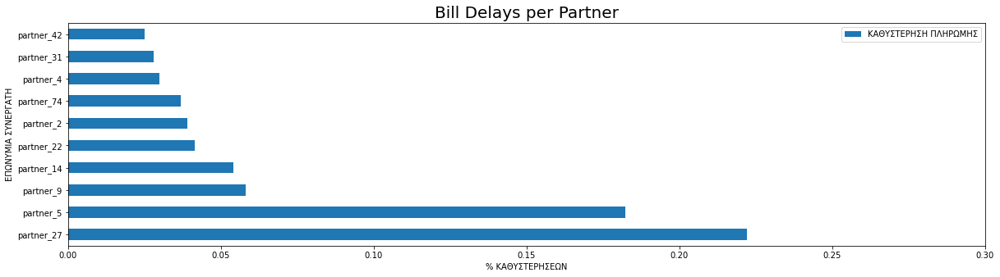

In [47]:
#bill delays per partner
(synergatis.sort_values(by='ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ',ascending=False)/synergatis.sum()).head(10).plot(kind='barh',figsize=(20,5))
plt.xlim(0,0.3)
plt.xlabel('% ΚΑΘΥΣΤΕΡΗΣΕΩΝ')
plt.ylabel('ΕΠΩΝΥΜΙΑ ΣΥΝΕΡΓΑΤΗ')
plt.title('Bill Delays per Partner',fontsize=20)

Apparently partner_27 and partner_5 have the most cases of late payments.
In order to investigate further first we calculate the % of the market that corresponds to each partner.

Below is the % of bills per partner

In [48]:
#what is the relationship of partners and payment status (i.e. who has the most unpaid bills)
((data['ΣΥΝΕΡΓΑΤΗΣ'].value_counts())/(data['ΣΥΝΕΡΓΑΤΗΣ'].value_counts().sum())*100).head()


partner_27    19.943065
partner_5     18.393612
partner_9      7.050250
partner_14     5.225638
partner_22     4.351791
Name: ΣΥΝΕΡΓΑΤΗΣ, dtype: float64

Since both partner_27 and partner_5  have much higher market share, it is not unusual for them to have more cases of payments delays.

In [49]:
synergatis=synergatis.sort_values(by='ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ',ascending=False) #sorting the values of synergatis

Lets investigate the number of defaults per partner

First lets check the number of clients per partner

In [50]:
#UNIQUE CLIENTS PER PARTNER
synergatis_clients=data
synergatis_clients=synergatis_clients.drop_duplicates('ΕΠΩΝΥΜΙΑ_2')
synergatis_clients=synergatis_clients.groupby(['ΣΥΝΕΡΓΑΤΗΣ'],as_index=False)['ΕΠΩΝΥΜΙΑ_2'].count()
synergatis_clients=synergatis_clients.sort_values('ΕΠΩΝΥΜΙΑ_2',ascending=False) 

synergatis_clients_percentage=data
synergatis_clients_percentage=synergatis_clients_percentage.drop_duplicates('ΕΠΩΝΥΜΙΑ_2')
synergatis_clients_percentage=synergatis_clients_percentage.groupby(['ΣΥΝΕΡΓΑΤΗΣ'],as_index=False)['ΕΠΩΝΥΜΙΑ_2'].count()
synergatis_clients_percentage['ΕΠΩΝΥΜΙΑ_2']=synergatis_clients_percentage['ΕΠΩΝΥΜΙΑ_2']/len(unique_clients)
synergatis_clients_percentage=synergatis_clients_percentage.sort_values('ΕΠΩΝΥΜΙΑ_2',ascending=False) 
synergatis_clients_percentage.head()


,ΣΥΝΕΡΓΑΤΗΣ,ΕΠΩΝΥΜΙΑ_2
68,partner_27,0.189905
93,partner_5,0.111672
137,partner_9,0.062250
61,partner_2,0.058044
82,partner_4,0.057203


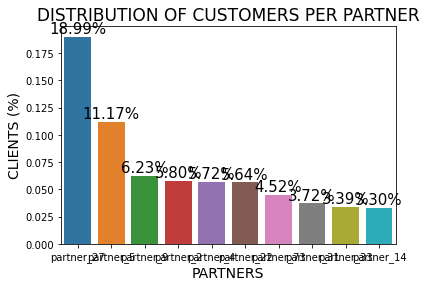

In [51]:
plt.tight_layout()
plots = sns.barplot(x="ΣΥΝΕΡΓΑΤΗΣ", y="ΕΠΩΝΥΜΙΑ_2", data=synergatis_clients_percentage.head(10))
for bar in plots.patches:
    plots.annotate(format(bar.get_height(), '.2%'), #to .0f einai o ari8mos twn dekadikwn, p.x. gia 2 dekadika einai .2f
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=15, xytext=(0, 8),
                   textcoords='offset points')
plt.xlabel("PARTNERS", size=14)
plt.xticks(size=10)
plt.ylabel("CLIENTS (%)", size=14) 
plt.title("DISTRIBUTION OF CUSTOMERS PER PARTNER",size=17)
plt.show()

In [52]:
#DEFAULTS PER PARTNER
#synergatis_defaults=data.groupby(['ΣΥΝΕΡΓΑΤΗΣ'],as_index=False)['Default Yes=1,No=0'].value_counts()
synergatis_defaults=data[data['Default Yes=1,No=0']==1].drop_duplicates('ΠΑΡΟΧΗ_2').groupby(['ΣΥΝΕΡΓΑΤΗΣ'],as_index=False)['Default Yes=1,No=0'].sum()
synergatis_defaults=synergatis_defaults.sort_values('Default Yes=1,No=0',ascending=False) 
#synergatis_defaults['Default Yes=1,No=0']=synergatis_defaults['Default Yes=1,No=0']/319*100
synergatis_defaults.head(10)

,ΣΥΝΕΡΓΑΤΗΣ,"Default Yes=1,No=0"
18,partner_27,71
31,partner_5,46
54,partner_9,24
47,partner_74,22
16,partner_2,20
24,partner_4,20
26,partner_42,19
19,partner_28,17
21,partner_31,16
17,partner_22,13


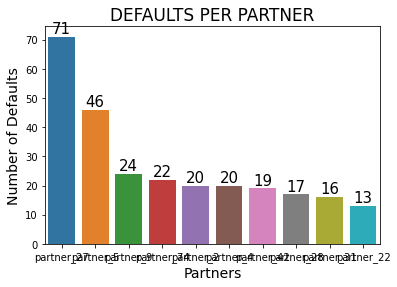

In [53]:
#plt.figure(figsize=(8, 8))
plt.tight_layout()
plots = sns.barplot(x="ΣΥΝΕΡΓΑΤΗΣ", y="Default Yes=1,No=0", data=synergatis_defaults.head(10))
for bar in plots.patches:
    plots.annotate(format(bar.get_height(), '.0f'), #to .0f einai o ari8mos twn dekadikwn, p.x. gia 2 dekadika einai .2f
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=15, xytext=(0, 8),
                   textcoords='offset points')
plt.xlabel("Partners", size=14)
plt.xticks(size=10)
plt.ylabel("Number of Defaults", size=14) 
plt.title("DEFAULTS PER PARTNER",size=17)
plt.show()

Calculating the % of defaults per partner population

In [54]:
total_defaults_per_partner=pd.merge(synergatis_defaults, synergatis_clients, on='ΣΥΝΕΡΓΑΤΗΣ', how='inner')
#total_defaults_per_partner=total_defaults_per_partner.set_index('ΣΥΝΕΡΓΑΤΗΣ')
total_defaults_per_partner['% of defaults per partner']=total_defaults_per_partner['Default Yes=1,No=0']/total_defaults_per_partner['ΕΠΩΝΥΜΙΑ_2']
total_defaults_per_partner=total_defaults_per_partner.head(15).sort_values('% of defaults per partner',ascending=False)
total_defaults_per_partner.head(15)

,ΣΥΝΕΡΓΑΤΗΣ,"Default Yes=1,No=0",ΕΠΩΝΥΜΙΑ_2,% of defaults per partner
10,partner_93,13,41,0.317073
7,partner_28,17,56,0.303571
3,partner_74,22,74,0.297297
6,partner_42,19,81,0.234568
8,partner_31,16,177,0.090395
1,partner_5,46,531,0.086629
2,partner_9,24,296,0.081081
13,partner_36,8,100,0.080000
0,partner_27,71,903,0.078627
5,partner_4,20,272,0.073529


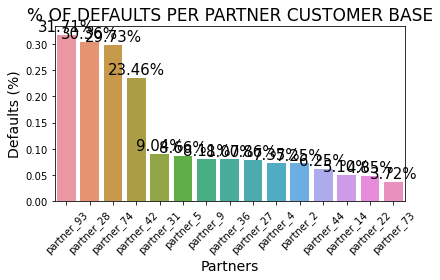

In [55]:
total_defaults_per_partner_graph = sns.barplot(x="ΣΥΝΕΡΓΑΤΗΣ", y="% of defaults per partner", data=total_defaults_per_partner[['ΣΥΝΕΡΓΑΤΗΣ','% of defaults per partner']].head(15))
for bar in total_defaults_per_partner_graph.patches:
    total_defaults_per_partner_graph.annotate(format(bar.get_height(), '.2%'), # .0f is the number of decimals
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=15, xytext=(0, 8),
                   textcoords='offset points')
plt.xlabel("Partners", size=14)
plt.ylabel("Defaults (%)", size=14) 
plt.title("% OF DEFAULTS PER PARTNER CUSTOMER BASE",size=17)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Count the number of high-risk customers that are close to a default state (delay>30) 

In [56]:
#count the number of 'dangerous' clients (delay>30)
one_month = lambda col : col[col > 30].count()
ontime = lambda col : col[col < 0].count()
def one_month(col): 
  return col[col > 30].count() 

def ontime(col): 
  return col[col < 0].count()

In [57]:
late_clients=data.groupby(['ΠΑΡΟΧΗ_2'])
late_clients=late_clients['ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ'].agg([('ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ', one_month)])
late_clients=late_clients.sort_values('ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ',ascending=False)
late_clients=late_clients.loc[(late_clients!=0).any(axis=1)] #removing clients that have never been late more than 30 days
late_clients.head()

,ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ
ΠΑΡΟΧΗ_2,
c5aa11824403e9149900c813326a9a14,50
f4ded75274f5e88183c5e412b59f3836,45
9b374765c18ea30563c905fdfa5da1a2,44
38e71b14ee13e6266dfaa48db14a6bef,44
2b15adb76e1256a6c6fd4384659e1c6e,43


In [58]:
#Getting the partners of the late clients
a=late_clients.index.values
a=pd.DataFrame(a)
late_clients['ΣΥΝΕΡΓΑΤΗΣ']=0
for i in range(len(late_clients)):
   #temp_ind=a.iloc[i,0]
   #temp=data.groupby("ΠΑΡΟΧΗ_2").get_group(temp_ind)["ΣΥΝΕΡΓΑΤΗΣ"]
   #temp=temp.value_counts()
   late_clients.iloc[i,1]=data['ΣΥΝΕΡΓΑΤΗΣ'].loc[data['ΠΑΡΟΧΗ_2'] == a.iloc[i,0]].value_counts().index.values[0]


In [59]:
late_clients2=late_clients.value_counts('ΣΥΝΕΡΓΑΤΗΣ') #Getting the number of dangerous clients each parnter has
late_clients2=pd.DataFrame(late_clients2)
late_clients2.reset_index(inplace=True)
late_clients2 = late_clients2.rename(columns = {'index':'new column name',0:'Number of dangerous clients'})
late_clients2.head()

,ΣΥΝΕΡΓΑΤΗΣ,Number of dangerous clients
0,partner_27,341
1,partner_5,259
2,partner_9,119
3,partner_22,83
4,partner_2,81


In [60]:
z=pd.merge(late_clients2, synergatis_clients, on='ΣΥΝΕΡΓΑΤΗΣ', how='inner')
z=z.set_index('ΣΥΝΕΡΓΑΤΗΣ')
z['% of bad clients']=z['Number of dangerous clients']/z['ΕΠΩΝΥΜΙΑ_2']
#z.head(15).plot.bar(stacked=True)
z.head()

,Number of dangerous clients,ΕΠΩΝΥΜΙΑ_2,% of bad clients
ΣΥΝΕΡΓΑΤΗΣ,,,
partner_27,341,903,0.377630
partner_5,259,531,0.487759
partner_9,119,296,0.402027
partner_22,83,268,0.309701
partner_2,81,276,0.293478


In [61]:
z.sort_values('ΕΠΩΝΥΜΙΑ_2',ascending=False).head()

,Number of dangerous clients,ΕΠΩΝΥΜΙΑ_2,% of bad clients
ΣΥΝΕΡΓΑΤΗΣ,,,
partner_27,341,903,0.377630
partner_5,259,531,0.487759
partner_9,119,296,0.402027
partner_2,81,276,0.293478
partner_4,65,272,0.238971


Plot the % of bad clients per partner population

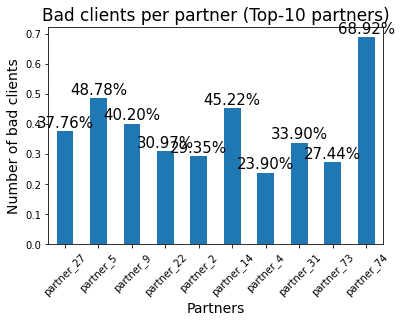

In [62]:
plt.tight_layout()
plots = z['% of bad clients'].head(10).plot.bar(stacked=True)
for bar in plots.patches:
    plots.annotate(format(bar.get_height(), '.2%'), #to .0f einai o ari8mos twn dekadikwn, p.x. gia 2 dekadika einai .2f
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=15, xytext=(0, 8),
                   textcoords='offset points')
plt.xticks(rotation=45)
plt.xlabel("Partners", size=14)
plt.ylabel("Number of bad clients", size=14) 
plt.title("Bad clients per partner (Top-10 partners)",size=17)
plt.show()

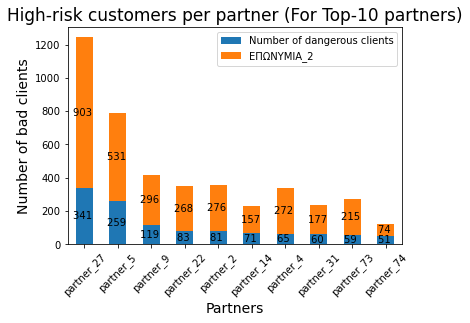

In [63]:
ax = z[['Number of dangerous clients','ΕΠΩΝΥΜΙΑ_2']].head(10).plot.bar(stacked=True)
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x+width/2, 
            y+height/2, 
            '{:.0f} '.format(height), 
            horizontalalignment='center', 
            verticalalignment='center')
plt.xticks(rotation=45)
plt.xlabel("Partners", size=14)
plt.ylabel("Number of bad clients", size=14) 
plt.title("High-risk customers per partner (For Top-10 partners)",size=17)
plt.show()

Let investigate the areas that have the most defaults

In [64]:
x=data[data['Default Yes=1,No=0']==1].drop_duplicates('ΠΑΡΟΧΗ_2').groupby(['ΕΠΩΝΥΜΙΑ ΔΗΜΟΥ'],as_index=False)['Default Yes=1,No=0'].sum()
x=x.sort_values('Default Yes=1,No=0',ascending=False) 


In [65]:
#UNIQUE CLIENTS PER AREA
dimos_customers=data
dimos_customers=dimos_customers.drop_duplicates('ΕΠΩΝΥΜΙΑ_2')
dimos_customers=dimos_customers.groupby(['ΕΠΩΝΥΜΙΑ ΔΗΜΟΥ'],as_index=False)['ΕΠΩΝΥΜΙΑ_2'].count()
dimos_customers=dimos_customers.sort_values('ΕΠΩΝΥΜΙΑ_2',ascending=False) 
dimos_customers_percentage=dimos_customers
dimos_customers_percentage['ΕΠΩΝΥΜΙΑ_2']=dimos_customers['ΕΠΩΝΥΜΙΑ_2']#/len(unique_clients)
dimos_customers_percentage.head()


,ΕΠΩΝΥΜΙΑ ΔΗΜΟΥ,ΕΠΩΝΥΜΙΑ_2
6,ΔΗΜΟΣ ΑΘΗΝΑΙΩΝ,959
39,ΔΗΜΟΣ ΚΑΛΛΙΘΕΑΣ,206
73,ΔΗΜΟΣ ΠΕΡΙΣΤΕΡΙΟΥ,199
31,ΔΗΜΟΣ ΖΩΓΡΑΦΟΥ,156
35,ΔΗΜΟΣ ΙΛΙΟΥ,134


In [66]:
#DEFAULTS PER DIMOS
dimos_defaults=data[data['Default Yes=1,No=0']==1].drop_duplicates('ΠΑΡΟΧΗ_2').groupby(['ΕΠΩΝΥΜΙΑ ΔΗΜΟΥ'],as_index=False)['Default Yes=1,No=0'].sum()
dimos_defaults=dimos_defaults.sort_values('Default Yes=1,No=0',ascending=False) 

In [67]:
dimos_total=pd.merge(dimos_defaults, dimos_customers, on='ΕΠΩΝΥΜΙΑ ΔΗΜΟΥ', how='inner')
dimos_total=dimos_total.set_index('ΕΠΩΝΥΜΙΑ ΔΗΜΟΥ')

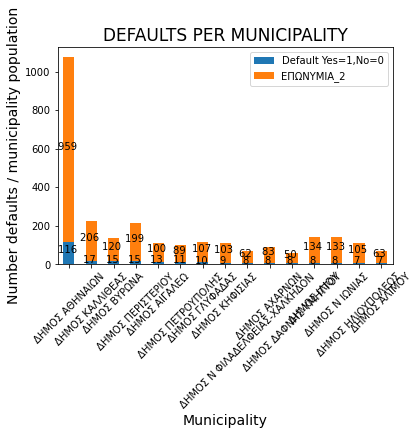

In [68]:
dimos_plot = dimos_total[['Default Yes=1,No=0','ΕΠΩΝΥΜΙΑ_2']].head(15).plot.bar(stacked=True)
for p in dimos_plot.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    dimos_plot.text(x+width/2, 
            y+height/2, 
            '{:.0f} '.format(height), 
            horizontalalignment='center', 
            verticalalignment='baseline')
plt.xticks(rotation=45)
plt.xlabel("Municipality", size=14)
plt.ylabel("Number defaults / municipality population", size=14) 
plt.title("DEFAULTS PER MUNICIPALITY",size=17)
plt.show()

Nothing irregular is observed.As expected municipality of Athens has recored the most defaults since it owns the biggest part of the clientbase.

Let's check the feature correlation.

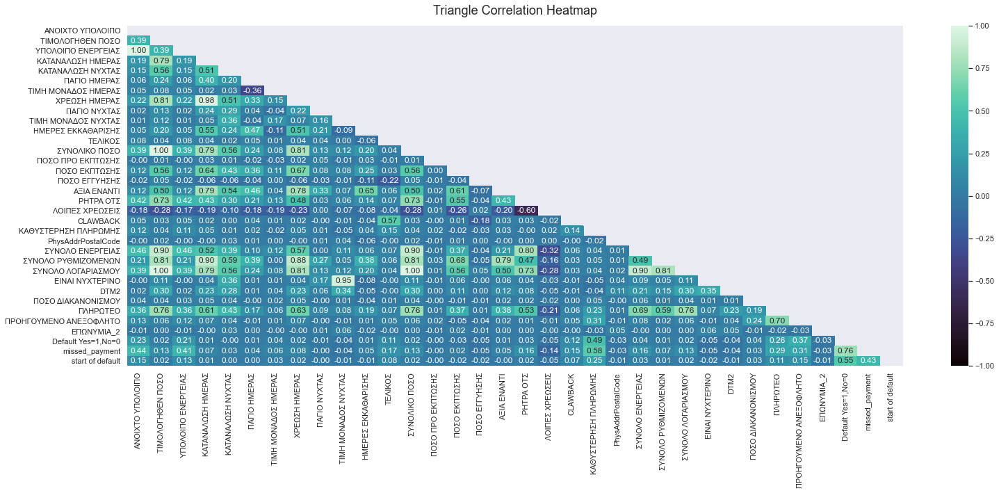

In [69]:
mask = np.triu(np.ones_like(data.corr(), dtype=bool))
sns.set(rc = {'figure.figsize':(25,9)})
heatmap = sns.heatmap(data.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='mako',fmt='.2f')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16);
#sns.set(rc = {'figure.figsize':(20,10)})
#sns.heatmap(data.corr(),cmap='mako',annot=True,vmin=-1, vmax=1,fmt='.2f')


We can see that some features are higly correlated. These will be removed at a later stage. 

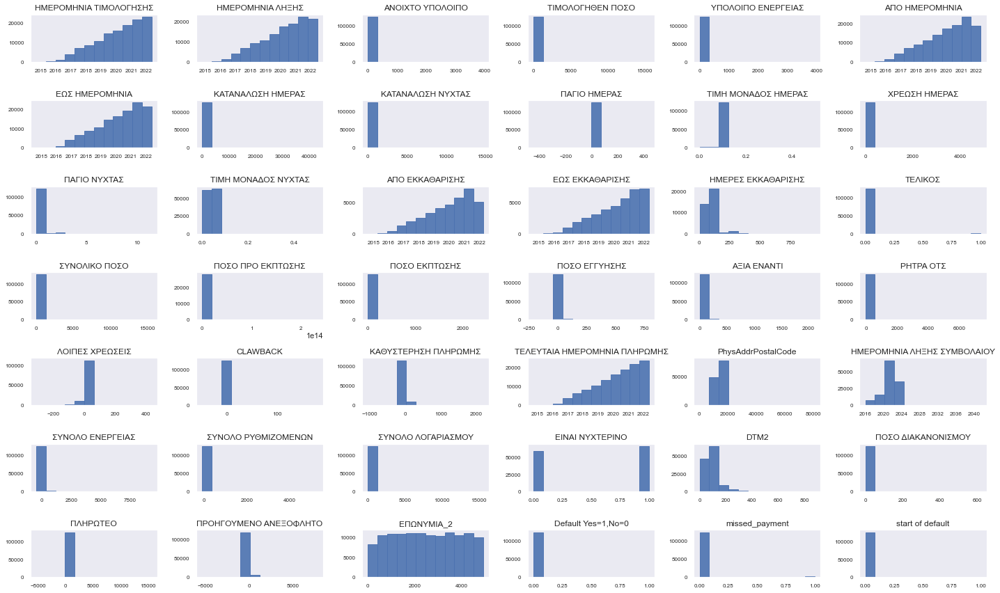

In [70]:
data.hist(figsize=(20,12), bins=12, ec="b", xlabelsize=8, ylabelsize=8, alpha=0.9, grid=False)
plt.tight_layout()

How does the open balance change through time?

Text(0.5, 1.0, 'OPEN BALANCE OVER TIME')

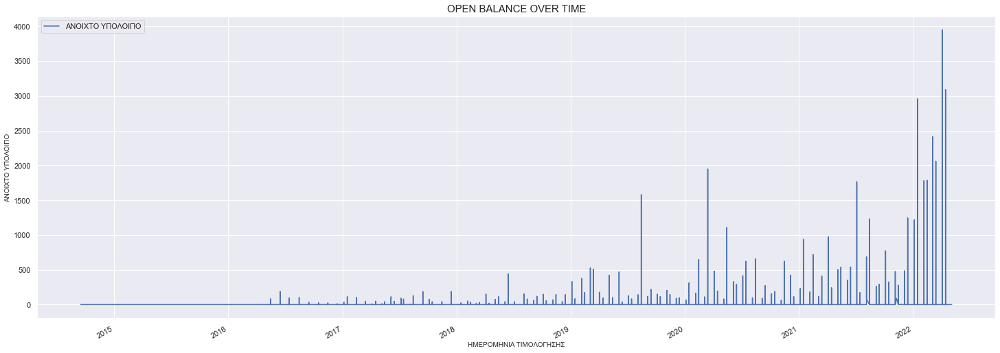

In [71]:
data.plot(x='ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ',y='ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ')
plt.xlabel("ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ", fontsize=10)
plt.ylabel('ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ', fontsize=10)
plt.title('OPEN BALANCE OVER TIME', fontsize=15)

From the above graph, the effects of covid-19 are evident.
Starting from 2020 the open balance amount show massive increases due to increased power consumption due to the quarantine (shown in the graph below).

Text(0.5, 1.0, 'POWER CONSUMPTION OVER TIME')

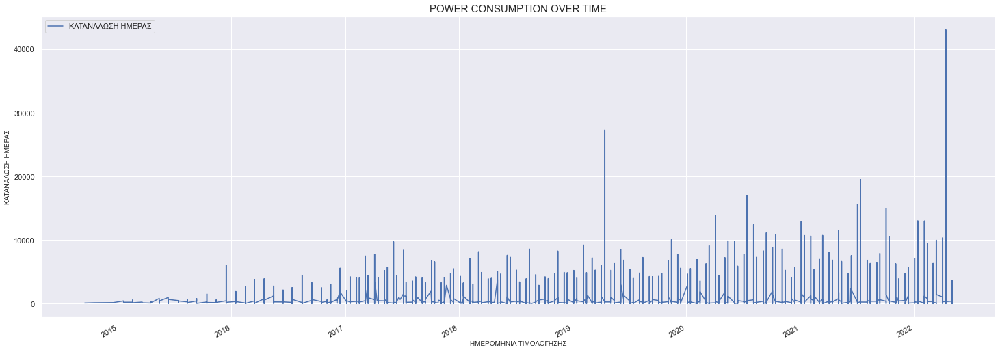

In [72]:
data.plot(x='ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ',y='ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ')
plt.xlabel("ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ", fontsize=10)
plt.ylabel('ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ', fontsize=10)
plt.title('POWER CONSUMPTION OVER TIME', fontsize=15)

Lets see how the defaults have evolved over time.

In [73]:
px.histogram(data,x='ΤΕΛΕΥΤΑΙΑ ΗΜΕΡΟΜΗΝΙΑ ΠΛΗΡΩΜΗΣ',y='Default Yes=1,No=0')

As expected most defaults occured after the start of the pandemic which was in 2020 with a significant rise in 2021 and 2022.

Now lets take a look of the number of clients leaving over time.

In [74]:
px.histogram(data,x='ΤΕΛΕΥΤΑΙΑ ΗΜΕΡΟΜΗΝΙΑ ΠΛΗΡΩΜΗΣ',y='ΤΕΛΙΚΟΣ')#color='στηλη που θελω να χρησιμοποιηθει για φιλτρο')

Once more , a big increase is observed after 2020 especially in 2022. Most probable causes are the aftereffects of covid ( quarantine, increased daily expenses, increased in electric power prices, energy crisis in 2022 etc.)

Lets see how many of the defaulters have left.

In [75]:
defaults_that_left=data[data['Default Yes=1,No=0']==1]
defaults_that_left=defaults_that_left[defaults_that_left['ΤΕΛΙΚΟΣ']==1]
defaults_that_left=defaults_that_left.drop_duplicates('ΠΑΡΟΧΗ_2')
len(defaults_that_left)

153

In [76]:
defaults_that_left_graph=np.zeros((0,0))
defaults_that_left_graph=pd.DataFrame(defaults_that_left_graph)
defaults_that_left_graph['defaults_that_left']=[len(defaults_that_left)]
defaults_that_left_graph['defaults that stayed']=[len(defaults)-len(defaults_that_left)]
defaults_that_left_graph=defaults_that_left_graph/len(defaults)


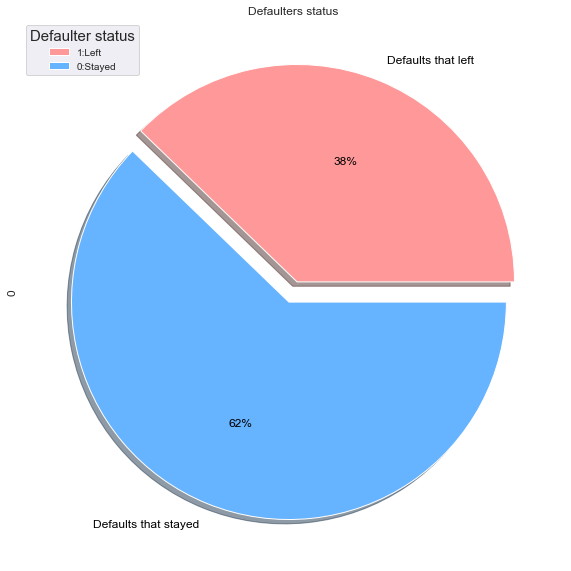

In [77]:
colors = ['#ff9999','#66b3ff']#,'#99ff99','#ffcc99']
defaults_that_left_graph.T.plot(kind='pie', subplots=True, autopct='%1.0f%%', legend=True, fontsize=12, figsize=(15,10), textprops={'color':"black"},shadow=True,explode=(0.05, 0.05),labels=['Defaults that left','Defaults that stayed'],colors=colors)
plt.legend(["1:Left","0:Stayed"],title="Defaulter status", fontsize=10, title_fontsize=15)

#plt.ylabel("")
plt.title('Defaulters status')
plt.show()

Its interesting to see that most of the defaulters (62%) have not terminated their cooperation.

Let's take a closer look at the characteristics of the defaulters

In [78]:
default_stats=data[data['Default Yes=1,No=0']==1]
default_stats.describe()

,ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ,ΤΙΜΟΛΟΓΗΘΕΝ ΠΟΣΟ,ΥΠΟΛΟΙΠΟ ΕΝΕΡΓΕΙΑΣ,ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ,ΚΑΤΑΝΑΛΩΣΗ ΝΥΧΤΑΣ,ΠΑΓΙΟ ΗΜΕΡΑΣ,ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ,ΧΡΕΩΣΗ ΗΜΕΡΑΣ,ΠΑΓΙΟ ΝΥΧΤΑΣ,ΤΙΜΗ ΜΟΝΑΔΟΣ ΝΥΧΤΑΣ,ΗΜΕΡΕΣ ΕΚΚΑΘΑΡΙΣΗΣ,ΤΕΛΙΚΟΣ,ΣΥΝΟΛΙΚΟ ΠΟΣΟ,ΠΟΣΟ ΠΡΟ ΕΚΠΤΩΣΗΣ,ΠΟΣΟ ΕΚΠΤΩΣΗΣ,ΠΟΣΟ ΕΓΓΥΗΣΗΣ,ΑΞΙΑ ΕΝΑΝΤΙ,ΡΗΤΡΑ ΟΤΣ,ΛΟΙΠΕΣ ΧΡΕΩΣΕΙΣ,CLAWBACK,ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ,PhysAddrPostalCode,ΣΥΝΟΛΟ ΕΝΕΡΓΕΙΑΣ,ΣΥΝΟΛΟ ΡΥΘΜΙΖΟΜΕΝΩΝ,ΣΥΝΟΛΟ ΛΟΓΑΡΙΑΣΜΟΥ,ΕΙΝΑΙ ΝΥΧΤΕΡΙΝΟ,DTM2,ΠΟΣΟ ΔΙΑΚΑΝΟΝΙΣΜΟΥ,ΠΛΗΡΩΤΕΟ,ΠΡΟΗΓΟΥΜΕΝΟ ΑΝΕΞΟΦΛΗΤΟ,ΕΠΩΝΥΜΙΑ_2,"Default Yes=1,No=0",missed_payment,start of default
count,1331.000000,1331.000000,1331.000000,1331.000000,1331.000000,1331.000000,1331.000000,1331.000000,1331.000000,1331.000000,382.000000,1331.000000,1331.000000,19.000000,1331.000000,1331.000000,1331.000000,1331.000000,1331.000000,1331.000000,1331.000000,1331.000000,1331.000000,1331.000000,1331.000000,1331.000000,1295.000000,1331.000000,1331.000000,1331.000000,1331.000000,1331.0,1331.000000,1331.000000
mean,105.858385,112.498835,96.092690,576.044328,89.331330,3.134433,0.103822,60.811202,0.030511,0.023483,99.958115,0.114951,112.498835,93.530526,0.393268,-4.508663,25.092246,31.858618,-13.158302,4.311473,411.486852,13693.555973,68.767408,24.387618,112.498835,0.309542,72.784556,4.007513,544.131908,431.633073,2101.889557,1.0,0.980466,0.305785
std,228.912493,229.782664,228.629448,798.592450,346.619892,10.390581,0.019331,97.307736,0.227491,0.037606,51.524306,0.319083,229.782664,123.723392,5.418250,20.374479,66.604691,118.218477,29.161578,16.539751,443.348518,2759.240135,153.121333,77.320672,229.782664,0.462478,47.406582,19.478848,613.832873,544.899684,1548.333945,0.0,0.138445,0.460912
min,0.000000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0.010000,0.830000,0.000000,-140.000000,0.000000,0.000000,-226.550000,0.000000,-18.000000,10433.000000,-252.590000,-51.170000,0.010000,0.000000,18.000000,0.000000,-1171.560000,-1206.170000,2.000000,1.0,0.000000,0.000000
25%,19.755000,25.710000,11.945000,185.000000,0.000000,0.000000,0.094300,18.025000,0.000000,0.000000,59.000000,0.000000,25.710000,18.845000,0.000000,0.000000,0.000000,0.000000,-2.880000,0.000000,65.000000,11257.000000,10.020000,0.000000,25.710000,0.000000,46.500000,0.000000,181.420000,111.215000,636.000000,1.0,1.000000,0.000000
50%,45.220000,51.520000,36.530000,351.000000,0.000000,0.000000,0.110280,35.950000,0.000000,0.000000,119.000000,0.000000,51.520000,49.520000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,249.000000,12461.000000,30.990000,0.000000,51.520000,0.000000,61.000000,0.000000,363.770000,270.320000,2004.000000,1.0,1.000000,0.000000
75%,89.445000,99.085000,76.595000,649.500000,52.500000,1.565000,0.110280,69.410000,0.000000,0.066100,123.000000,0.000000,99.085000,109.540000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,645.000000,16232.000000,64.020000,14.545000,99.085000,1.000000,90.000000,0.000000,675.305000,533.715000,3366.000000,1.0,1.000000,1.000000
max,3945.600000,3945.600000,3945.600000,9803.000000,5354.000000,234.090000,0.500000,1953.000000,2.310000,0.500000,365.000000,1.000000,3945.600000,482.030000,144.610000,140.000000,736.290000,1479.430000,28.270000,90.000000,2166.000000,19600.000000,2539.230000,1136.490000,3945.600000,1.000000,582.000000,276.000000,4839.230000,4366.770000,4905.000000,1.0,1.000000,1.000000


First lets get the IDs of the defaulters 

In [79]:
#defaulters=data['ΠΑΡΟΧΗ_2'][data['Default Yes=1,No=0']==1]

In [80]:
#defaulters=data[data['Default Yes=1,No=0']==1]['ΠΑΡΟΧΗ_2'].drop_duplicates()

In [81]:
defaulters_total=data.loc[data['ΠΑΡΟΧΗ_2'].isin(defaults)]
normal_customers=data.loc[~data['ΠΑΡΟΧΗ_2'].isin(defaults)]# to data me tous pelates pou DEN ekanan default

Create new variables from dates for further investigation

In [82]:
defaulters_total.head()

,ΕΠΩΝΥΜΙΑ ΠΑΚΕΤΟΥ,ΤΥΠΟΣ ΤΙΜΟΛΟΓΙΟΥ,ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ,ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ,ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ,ΚΑΤΑΣΤΑΣΗ ΤΙΜΟΛΟΓΙΟΥ,ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ,ΤΙΜΟΛΟΓΗΘΕΝ ΠΟΣΟ,ΥΠΟΛΟΙΠΟ ΕΝΕΡΓΕΙΑΣ,ΑΠΟ ΗΜΕΡΟΜΗΝΙΑ,ΕΩΣ ΗΜΕΡΟΜΗΝΙΑ,ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ,ΚΑΤΑΝΑΛΩΣΗ ΝΥΧΤΑΣ,ΠΑΓΙΟ ΗΜΕΡΑΣ,ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ,ΧΡΕΩΣΗ ΗΜΕΡΑΣ,ΠΑΓΙΟ ΝΥΧΤΑΣ,ΤΙΜΗ ΜΟΝΑΔΟΣ ΝΥΧΤΑΣ,ΑΠΟ ΕΚΚΑΘΑΡΙΣΗΣ,ΕΩΣ ΕΚΚΑΘΑΡΙΣΗΣ,ΗΜΕΡΕΣ ΕΚΚΑΘΑΡΙΣΗΣ,ΤΕΛΙΚΟΣ,ΣΥΝΟΛΙΚΟ ΠΟΣΟ,ΠΟΣΟ ΠΡΟ ΕΚΠΤΩΣΗΣ,ΠΟΣΟ ΕΚΠΤΩΣΗΣ,ΠΟΣΟ ΕΓΓΥΗΣΗΣ,ΑΞΙΑ ΕΝΑΝΤΙ,ΡΗΤΡΑ ΟΤΣ,ΛΟΙΠΕΣ ΧΡΕΩΣΕΙΣ,CLAWBACK,ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ,ΚΑΤΑΣΤΑΣΗ ΑΠΟΠΛΗΡΩΜΗΣ,ΤΕΛΕΥΤΑΙΑ ΗΜΕΡΟΜΗΝΙΑ ΠΛΗΡΩΜΗΣ,ΕΠΩΝΥΜΙΑ ΔΗΜΟΥ,ΣΥΝΕΡΓΑΤΗΣ,PhysAddrStreetNumber,PhysAddrPostalCode,PhysAddrPrefecture,ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ ΣΥΜΒΟΛΑΙΟΥ,ΣΥΝΟΛΟ ΕΝΕΡΓΕΙΑΣ,ΣΥΝΟΛΟ ΡΥΘΜΙΖΟΜΕΝΩΝ,ΣΥΝΟΛΟ ΛΟΓΑΡΙΑΣΜΟΥ,ΕΙΝΑΙ ΝΥΧΤΕΡΙΝΟ,DTM2,ΠΟΣΟ ΔΙΑΚΑΝΟΝΙΣΜΟΥ,ΠΛΗΡΩΤΕΟ,ΠΡΟΗΓΟΥΜΕΝΟ ΑΝΕΞΟΦΛΗΤΟ,ΕΠΩΝΥΜΙΑ_2,ΠΑΡΟΧΗ_2,"Default Yes=1,No=0",missed_payment,period,default date,start of default,ΜΗΝΑΣ/ΕΤΟΣ ΛΗΞΗΣ ΤΙΜΟΛΟΓΗΣΗΣ
20,p-2,ΕΝΑΝΤΙ,2021-03-15,2021-04-06,PAID,INVOICED,0.0,117.41,0.0,2021-01-22,2021-03-15,399.0,0.0,0.00,0.11028,44.00,0.0,0.0,NaT,NaT,NaN,0,117.41,NaN,0.0,47.6,0.00,0.0,0.0,0.0,0,ONTIME,2021-04-06,ΔΗΜΟΣ ΑΛΙΜΟΥ,partner_44,8,17456.0,ΑΤΤΙΚΗΣ,2023-01-22,44.00,0.00,117.41,0,52.0,0.0,117.41,0.00,4105,000d5cfd2c57adb31ec90554791e8201,0,0,2021-03,0,0,2021-04
21,p-2,ΕΝΑΝΤΙ,2021-04-15,2021-05-07,PAID,INVOICED,0.0,39.88,0.0,2021-03-15,2021-04-15,223.0,0.0,0.00,0.11028,24.59,0.0,0.0,NaT,NaT,NaN,0,39.88,NaN,0.0,0.0,0.00,0.0,0.0,0.0,17,OVERDUE,2021-05-24,ΔΗΜΟΣ ΑΛΙΜΟΥ,partner_44,8,17456.0,ΑΤΤΙΚΗΣ,2023-01-22,24.59,0.00,39.88,0,52.0,0.0,39.88,0.00,4105,000d5cfd2c57adb31ec90554791e8201,0,0,2021-04,0,0,2021-05
22,p-2,ΕΚΚΑΘΑΡΙΣΤΙΚΟΣ,2021-05-15,2021-06-07,PAID,INVOICED,0.0,140.58,0.0,2021-01-22,2021-04-23,1151.0,0.0,7.89,0.11028,126.93,0.0,0.0,2021-01-22,2021-04-23,91.0,0,140.58,NaN,0.0,0.0,68.59,0.0,0.0,0.0,23,OVERDUE,2021-06-30,ΔΗΜΟΣ ΑΛΙΜΟΥ,partner_44,8,17456.0,ΑΤΤΙΚΗΣ,2023-01-22,66.23,59.64,140.58,0,52.0,0.0,180.46,39.88,4105,000d5cfd2c57adb31ec90554791e8201,0,0,2021-05,0,0,2021-06
23,p-2,ΕΝΑΝΤΙ,2021-06-15,2021-07-07,PAID,INVOICED,0.0,73.23,0.0,2021-04-23,2021-06-15,424.0,0.0,0.00,0.11028,46.76,0.0,0.0,NaT,NaT,NaN,0,73.23,NaN,0.0,0.0,0.00,0.0,0.0,0.0,91,OVERDUE,2021-10-06,ΔΗΜΟΣ ΑΛΙΜΟΥ,partner_44,8,17456.0,ΑΤΤΙΚΗΣ,2023-01-22,46.76,0.00,73.23,0,52.0,0.0,153.69,80.46,4105,000d5cfd2c57adb31ec90554791e8201,0,0,2021-06,0,0,2021-07
24,p-2,ΕΝΑΝΤΙ,2021-07-15,2021-08-06,PAID,INVOICED,0.0,44.57,0.0,2021-06-15,2021-07-15,264.0,0.0,0.00,0.11028,29.11,0.0,0.0,NaT,NaT,NaN,0,44.57,NaN,0.0,0.0,0.00,0.0,0.0,0.0,61,OVERDUE,2021-10-06,ΔΗΜΟΣ ΑΛΙΜΟΥ,partner_44,8,17456.0,ΑΤΤΙΚΗΣ,2023-01-22,29.11,0.00,44.57,0,52.0,0.0,98.26,53.69,4105,000d5cfd2c57adb31ec90554791e8201,0,0,2021-07,0,0,2021-08


In [83]:
normal_customers['ΕΤΟΣ ΤΙΜΟΛΟΓΗΣΗΣ']=normal_customers['ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ'].dt.year
normal_customers['ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ']=normal_customers['ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ'].dt.month
normal_customers['ΜΗΝΑΣ/ΕΤΟΣ ΤΙΜΟΛΟΓΗΣΗΣ']=normal_customers['ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ'].dt.to_period('M')
normal_customers['ΜΗΝΑΣ/ΕΤΟΣ ΠΛΗΡΩΜΗΣ']=normal_customers['ΤΕΛΕΥΤΑΙΑ ΗΜΕΡΟΜΗΝΙΑ ΠΛΗΡΩΜΗΣ'].dt.to_period('M')
normal_customers['ΜΗΝΑΣ/ΕΤΟΣ ΛΗΞΗΣ ΣΥΜΒΟΛΑΙΟΥ']=normal_customers['ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ ΣΥΜΒΟΛΑΙΟΥ'].dt.to_period('M')
defaulters_total['ΕΤΟΣ ΤΙΜΟΛΟΓΗΣΗΣ']=defaulters_total['ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ'].dt.year
defaulters_total['ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ']=defaulters_total['ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ'].dt.month
defaulters_total['ΜΗΝΑΣ/ΕΤΟΣ ΤΙΜΟΛΟΓΗΣΗΣ']=defaulters_total['ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ'].dt.to_period('M')
defaulters_total['ΜΗΝΑΣ/ΕΤΟΣ ΠΛΗΡΩΜΗΣ']=defaulters_total['ΤΕΛΕΥΤΑΙΑ ΗΜΕΡΟΜΗΝΙΑ ΠΛΗΡΩΜΗΣ'].dt.to_period('M')
defaulters_total['ΜΗΝΑΣ/ΕΤΟΣ ΛΗΞΗΣ ΣΥΜΒΟΛΑΙΟΥ']=defaulters_total['ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ ΣΥΜΒΟΛΑΙΟΥ'].dt.to_period('M')
data['ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ']=data['ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ'].dt.month

<ipython-input-83-b045ae5e4a27>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-83-b045ae5e4a27>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-83-b045ae5e4a27>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-83-b045ae5

Plot the consumption of the defaulters over time

In [84]:
px.histogram(defaulters_total,x='ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ',y='ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ',histfunc='avg')

In [85]:
px.histogram(defaulters_total,x='ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ',y='ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ',color='Default Yes=1,No=0',histfunc='avg')

In [86]:
def line_plot(value_1a,value_1b,value_2a,value_2b,title):
 a_not_default=normal_customers.copy(deep=True) 
 a_not_default.drop(a_not_default.columns.difference([value_1a,value_1b]), 1, inplace=True)
 #normal_customers.groupby('ΜΗΝΑΣ/ΕΤΟΣ ΤΙΜΟΛΟΓΗΣΗΣ')['ΣΥΝΟΛΟ ΛΟΓΑΡΙΑΣΜΟΥ'].mean().plot()

 b_default=defaulters_total.copy(deep=True)
 b_default.drop(b_default.columns.difference([value_2a,value_2b]), 1, inplace=True)

 ab_total=pd.merge(a_not_default,b_default, on=value_1a, how='inner')
 #ab_total=ab_total.rename(columns = {'ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ_x':'ΣΥΝΟΛΙΚΟ ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ','ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ_y':'ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ DEFAULTERS'})
 #ab=ab.set_index('ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ')

 (ab_total.groupby(value_1a).mean()).plot()
 plt.legend(['Normal Customers','Defaulters'])
 plt.title(title)
  #plt.ylim(-10,100)


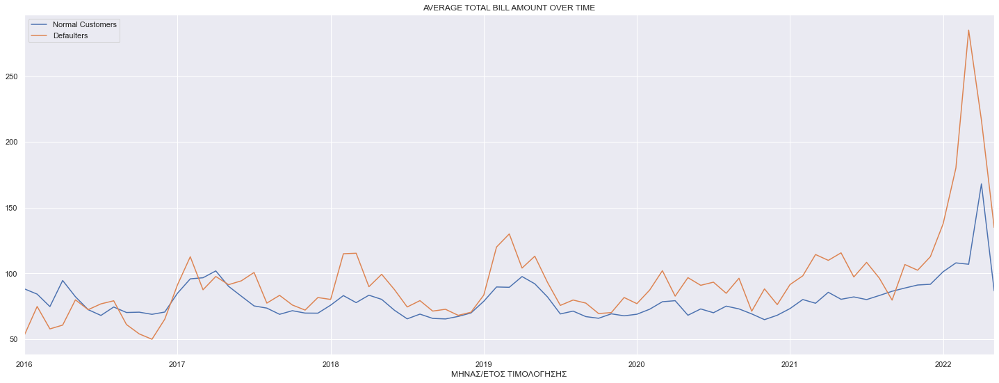

In [87]:
line_plot('ΜΗΝΑΣ/ΕΤΟΣ ΤΙΜΟΛΟΓΗΣΗΣ','ΣΥΝΟΛΟ ΛΟΓΑΡΙΑΣΜΟΥ','ΜΗΝΑΣ/ΕΤΟΣ ΤΙΜΟΛΟΓΗΣΗΣ','ΣΥΝΟΛΟ ΛΟΓΑΡΙΑΣΜΟΥ','AVERAGE TOTAL BILL AMOUNT OVER TIME')

Defaulters tend to have higher power consumption than normal customers. A big spike is observed in 2022 for both normal and defaulters , which is probably due to the 2022 energy crisis.

While both normal and default customers seem to be getting around the same bill amounts, defaulters show a significant increase after 2020.

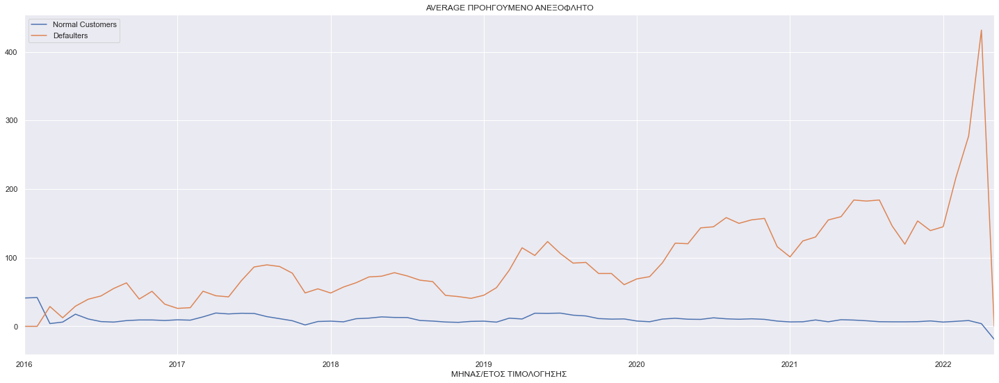

In [88]:
line_plot('ΜΗΝΑΣ/ΕΤΟΣ ΤΙΜΟΛΟΓΗΣΗΣ','ΠΡΟΗΓΟΥΜΕΝΟ ΑΝΕΞΟΦΛΗΤΟ','ΜΗΝΑΣ/ΕΤΟΣ ΤΙΜΟΛΟΓΗΣΗΣ','ΠΡΟΗΓΟΥΜΕΝΟ ΑΝΕΞΟΦΛΗΤΟ','AVERAGE ΠΡΟΗΓΟΥΜΕΝΟ ΑΝΕΞΟΦΛΗΤΟ')

The total debt of defaulters is showing significant increase after the pandemic (2020)

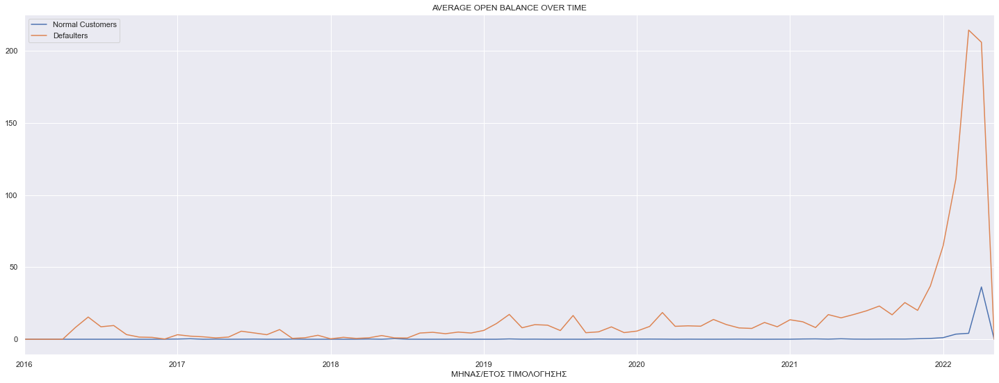

In [89]:
line_plot('ΜΗΝΑΣ/ΕΤΟΣ ΤΙΜΟΛΟΓΗΣΗΣ','ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ','ΜΗΝΑΣ/ΕΤΟΣ ΤΙΜΟΛΟΓΗΣΗΣ','ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ','AVERAGE OPEN BALANCE OVER TIME')

Open balance , which is the unpaid amount of the current bill, is showing a very big spike at the end of 2021 ( energy crisis )  

From the above plot it is evident that the defaulters have a history of unpaid bills (mainly from 2019 and forth), while regular customers not much.

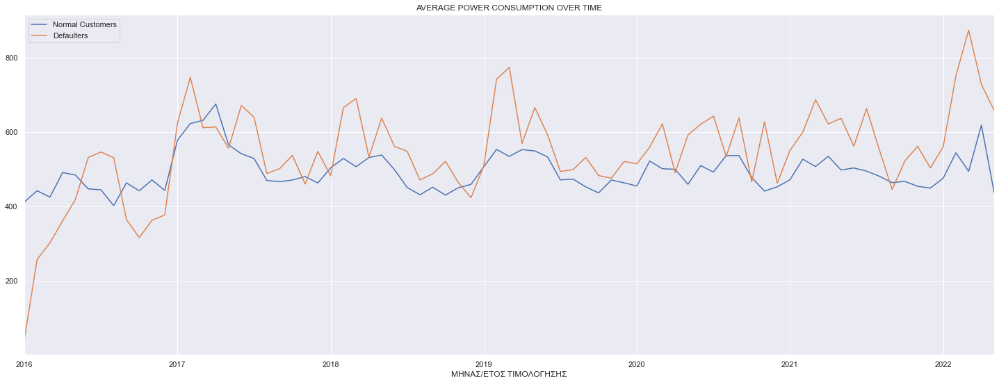

In [90]:
line_plot('ΜΗΝΑΣ/ΕΤΟΣ ΤΙΜΟΛΟΓΗΣΗΣ','ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ','ΜΗΝΑΣ/ΕΤΟΣ ΤΙΜΟΛΟΓΗΣΗΣ','ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ','AVERAGE POWER CONSUMPTION OVER TIME')

Aside from a spike in 2022 no significant patterns are observed as far as power consumption goes.

Annualized Default Rate (Defaults per Year)

In [91]:
annual_def=defaulters_total.copy(deep=True)
annual_def.drop(annual_def.columns.difference(['ΠΑΡΟΧΗ_2','ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ','Default Yes=1,No=0']),1,inplace=True)
annual_def['default_year']=annual_def['ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ'].dt.year #extract month and year of default
annual_def['default_month']=annual_def['ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ'].dt.month#to_period('M')#month ##
annual_def.drop('ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ',1,inplace=True)    
annual_def=annual_def[annual_def['Default Yes=1,No=0']==1]  
annual_def=annual_def.drop_duplicates('ΠΑΡΟΧΗ_2')

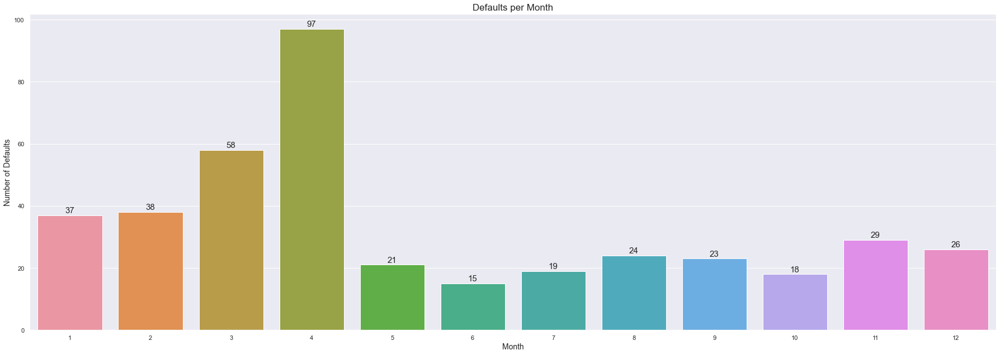

In [92]:
plot_defaults_per_year = sns.countplot(x="default_month", data=annual_def)
for bar in plot_defaults_per_year.patches:
    plot_defaults_per_year.annotate(format(bar.get_height(), '.0f'), 
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=15, xytext=(0, 8),
                   textcoords='offset points')
plt.xlabel("Month", size=14)
plt.ylabel("Number of Defaults", size=14) 
plt.title('Defaults per Month',size=17)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

Apparently more defaults are observed in Q1 of every year escpecially in March and April(Those bills refer to the period after January which are the coldest months, therefore there is higher consumption for heat).

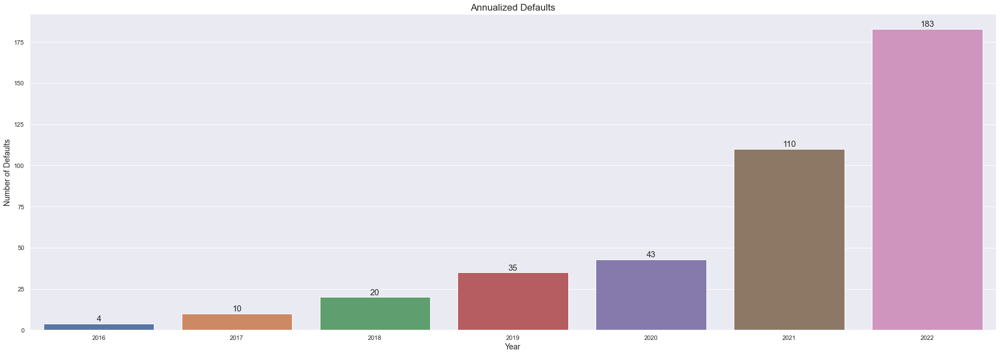

In [93]:
plot_defaults_per_year = sns.countplot(x="default_year", data=annual_def)
for bar in plot_defaults_per_year.patches:
    plot_defaults_per_year.annotate(format(bar.get_height(), '.0f'), #to .0f einai o ari8mos twn dekadikwn, p.x. gia 2 dekadika einai .2f
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=15, xytext=(0, 8),
                   textcoords='offset points')
plt.xlabel("Year", size=14)
plt.ylabel("Number of Defaults", size=14) 
plt.title('Annualized Defaults',size=17)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

Most defaults are observerd after 2020 (start of the pandemic) with a significant spike in 2022 ( energy crisis --> increased bill amounts)

In [94]:
data['default_year']=data['ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ'].dt.year
customers_per_year=data.groupby("default_year").agg({ "ΕΠΩΝΥΜΙΑ_2": pd.Series.nunique})
annualized_default_rate=annual_def['default_year'].value_counts()
annualized_default_rate=pd.DataFrame(annualized_default_rate)
annualized_default_rate=annualized_default_rate.join(customers_per_year)
annualized_default_rate['default_rate']=annualized_default_rate['default_year']/annualized_default_rate['ΕΠΩΝΥΜΙΑ_2']

In [95]:
annualized_default_rate

,default_year,ΕΠΩΝΥΜΙΑ_2,default_rate
2022,183,3399,0.053839
2021,110,3683,0.029867
2020,43,2969,0.014483
2019,35,2290,0.015284
2018,20,1678,0.011919
2017,10,1154,0.008666
2016,4,522,0.007663


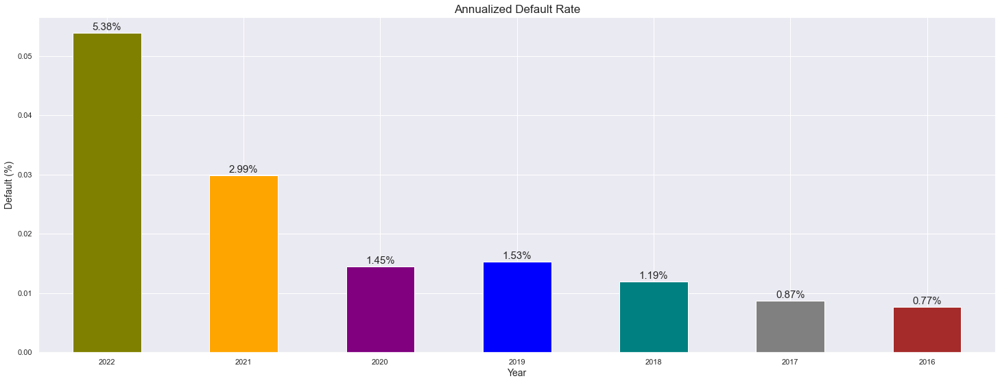

In [96]:
plt.tight_layout()
plots = annualized_default_rate['default_rate'].plot.bar(stacked=True,color=['olive', 'orange', 'purple', 'blue', 'teal','gray','brown'])
for bar in plots.patches:
    plots.annotate(format(bar.get_height(), '.2%'), #to .0f einai o ari8mos twn dekadikwn, p.x. gia 2 dekadika einai .2f
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=15, xytext=(0, 8),
                   textcoords='offset points')
plt.xticks(rotation=0)
plt.xlabel("Year", size=14)
plt.ylabel("Default (%)", size=14) 
plt.title("Annualized Default Rate",size=17)
plt.show()

Default rate shows a rising trend (2019 has a higher rate than 2020 due to the fact that the customerbase grew in 2020 , while the defaults were the same as 2019).

HOW LONG DID THE COOPERATION LAST FOR THE AVERAGE DEFAULTER?

Assumption:the cooperation starts at the earliest bill date and ends at the latest bill date where ΤΕΛΙΚΟΣ=1

In [97]:
def_length=defaulters_total.copy(deep=True)
def_length.drop(def_length.columns.difference(['ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ','Default Yes=1,No=0','ΠΑΡΟΧΗ_2','ΜΗΝΑΣ/ΕΤΟΣ ΛΗΞΗΣ ΣΥΜΒΟΛΑΙΟΥ']),1,inplace=True)
#def_length['start date']=def_length['ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ'].dt.month
def_length['start date']=def_length['ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ']#.dt.to_period('M')
def_length['default date']=def_length['ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ']#.dt.to_period('M')
def_length['number of contracts']=0


In [98]:
def_length.sort_values(by='number of contracts').head()

,ΗΜΕΡΟΜΗΝΙΑ ΤΙΜΟΛΟΓΗΣΗΣ,ΠΑΡΟΧΗ_2,"Default Yes=1,No=0",ΜΗΝΑΣ/ΕΤΟΣ ΛΗΞΗΣ ΣΥΜΒΟΛΑΙΟΥ,start date,default date,number of contracts
20,2021-03-15,000d5cfd2c57adb31ec90554791e8201,0,2023-01,2021-03-15,2021-03-15,0
84515,2018-04-05,b110cd3d7c1cdf370f044755252bf32b,0,2019-02,2018-04-05,2018-04-05,0
84516,2018-05-05,b110cd3d7c1cdf370f044755252bf32b,0,2019-02,2018-05-05,2018-05-05,0
84517,2018-06-05,b110cd3d7c1cdf370f044755252bf32b,0,2019-02,2018-06-05,2018-06-05,0
84518,2018-07-05,b110cd3d7c1cdf370f044755252bf32b,0,2019-02,2018-07-05,2018-07-05,0


In [99]:
for i in range(len(defaults)):
    def_length.loc[def_length['ΠΑΡΟΧΗ_2']==defaults.iloc[i],'start date']=def_length[def_length['ΠΑΡΟΧΗ_2']==defaults.iloc[i]]['start date'].min()
    def_length.loc[def_length['ΠΑΡΟΧΗ_2']==defaults.iloc[i],'default date']=def_length[def_length['ΠΑΡΟΧΗ_2']==defaults.iloc[i]]['default date'].max()

In [100]:
def_length['cooperation length in months']=((def_length['default date']-def_length['start date'])/ np.timedelta64(1, 'M')).round().astype(int)
def_length_plot=def_length[def_length['Default Yes=1,No=0']==1] 

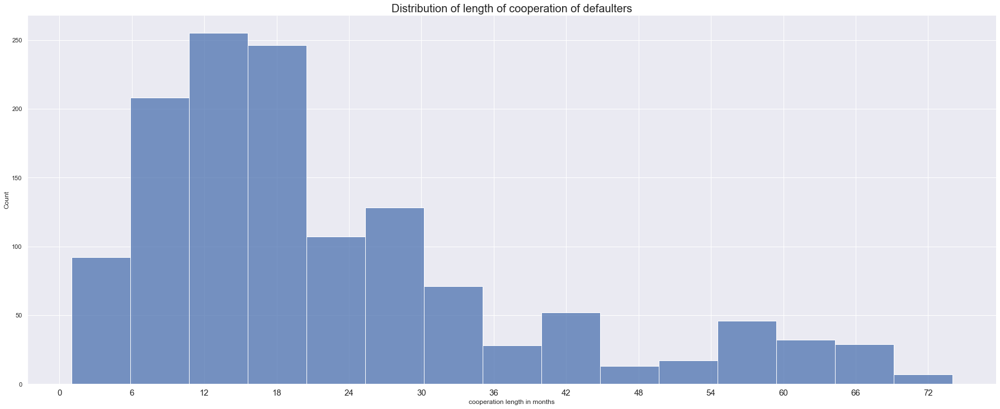

In [101]:
#def_length.plot(x='Default Yes=1,No=0',y='cooperation length')
p=sns.displot(def_length_plot, x='cooperation length in months',height=10, aspect=15/6,bins=15)
plt.title('Distribution of length of cooperation of defaulters',size=20)
x_ticks=[0,6,12,18,24,30,36,42,48,54,60,66,72]
plt.xticks(ticks=x_ticks,size=15)
plt.show()

Do defaulters renew their contracts?

Assumption : number of contracts is extracted from the number of unique values for in customer in 'contract end date'.

In [102]:
contracts_defaulters=def_length.groupby('ΠΑΡΟΧΗ_2')['ΜΗΝΑΣ/ΕΤΟΣ ΛΗΞΗΣ ΣΥΜΒΟΛΑΙΟΥ'].nunique().sort_values(ascending=False).value_counts(1)

In [103]:
contracts_normal=normal_customers.groupby('ΠΑΡΟΧΗ_2')['ΜΗΝΑΣ/ΕΤΟΣ ΛΗΞΗΣ ΣΥΜΒΟΛΑΙΟΥ'].nunique().sort_values(ascending=False).value_counts(1)

In [104]:
contracts_normal=pd.DataFrame(contracts_normal)
contracts_defaulters=pd.DataFrame(contracts_defaulters)
mix_contracts=pd.concat([contracts_normal,contracts_defaulters],axis=1)
mix_contracts.drop([0,4],axis=0,inplace=True)

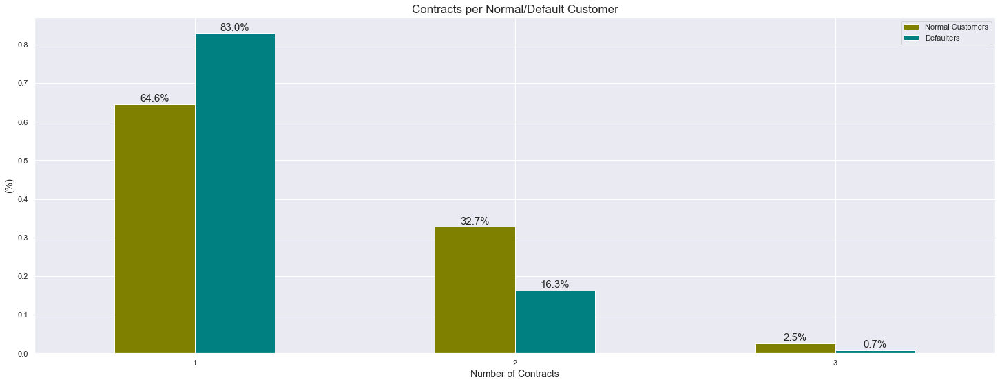

In [105]:
plots=mix_contracts.plot.bar(rot=0,color=['olive', 'teal','gray','brown'])
for bar in plots.patches:
    plots.annotate(format(bar.get_height(), '.1%'), #to .0f einai o ari8mos twn dekadikwn, p.x. gia 2 dekadika einai .2f
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=15, xytext=(0, 8),
                   textcoords='offset points')
plt.xticks(rotation=0)
plt.xlabel('Number of Contracts', size=14)
plt.ylabel("(%)", size=14) 
plt.title("Contracts per Normal/Default Customer",size=17)
plt.legend(['Normal Customers','Defaulters'])
plt.show()

Apparently defaulters tend to stop paying within the first year.

Most common packages amongst the defaults

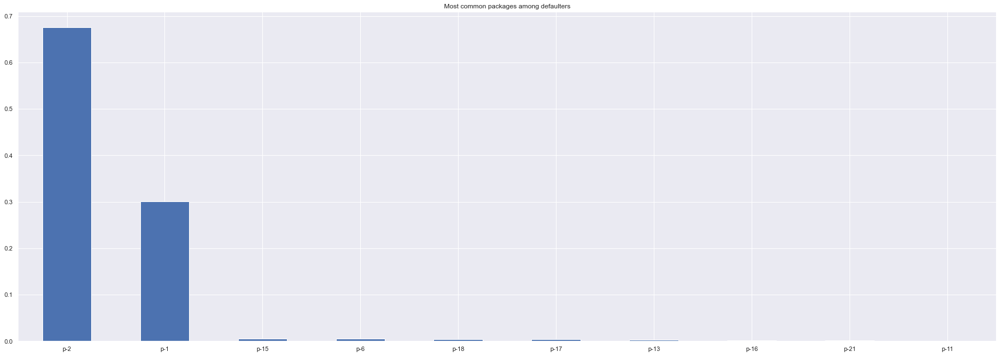

In [106]:
data[data['Default Yes=1,No=0']==1]['ΕΠΩΝΥΜΙΑ ΠΑΚΕΤΟΥ'].value_counts(1).plot(kind='bar')
plt.tight_layout()
plt.xticks(rotation=0)
plt.title('Most common packages among defaulters')
plt.show()

In [107]:
defaulters_total.groupby('ΠΑΡΟΧΗ_2')['ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ'].value_counts(1)

#data = data[data["ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ"].str.contains("-") == False]

ΠΑΡΟΧΗ_2                          ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ
000d5cfd2c57adb31ec90554791e8201  PAID                  0.769231
                                  UNPAID                0.230769
01420b6397473b23cbd131b09fe0ea62  PAID                  0.900000
                                  UNPAID                0.100000
01d66888d696b64cdd0e55b1b3b2c362  PAID                  0.500000
                                  UNPAID                0.500000
01efc76a4a3f616a77730e6da7521ff7  PAID                  0.764706
                                  UNPAID                0.235294
022a9f711ea03054030d6879d29ac3d4  PAID                  0.948718
                                  UNPAID                0.051282
029e345000d7e3831f5ecf1869e9bdf0  PAID                  0.916667
                                  UNPAID                0.083333
0372d926836b71e4d0e993c4b659e486  PAID                  0.888889
                                  UNPAID                0.111111
03a62ecef1af623e206ff734c005fa0e  PAI

In [108]:
#defaulters_total[defaulters_total['ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ'].str.contains('UNPAID')==True].groupby('ΠΑΡΟΧΗ_2')['ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ'].value_counts().sort_values(ascending=False)

In [109]:
#normal_customers[normal_customers['ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ'].str.contains('UNPAID')==True].groupby('ΠΑΡΟΧΗ_2')['ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ'].value_counts().sort_values(ascending=False)

In [110]:
#data[data['ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ'].str.contains('UNPAID')==True].groupby('ΠΑΡΟΧΗ_2')['ΚΑΤΑΣΤΑΣΗ ΠΛΗΡΩΜΗΣ'].value_counts().sort_values(ascending=False)

DATA CLEANING

Drop irellevant features. ΚΑΤΑΣΤΑΣΗ ΤΙΜΟΛΟΓΙΟΥ does not offer any information.

In [111]:
data.drop(['ΚΑΤΑΣΤΑΣΗ ΤΙΜΟΛΟΓΙΟΥ'], axis = 1,inplace=True)

The below attributes have 70% missing values so they are removed

In [112]:
data.drop(['ΠΟΣΟ ΠΡΟ ΕΚΠΤΩΣΗΣ'], axis = 1,inplace=True)
data.drop(['ΗΜΕΡΕΣ ΕΚΚΑΘΑΡΙΣΗΣ'], axis = 1,inplace=True)
data.drop(['ΕΩΣ ΕΚΚΑΘΑΡΙΣΗΣ'], axis = 1,inplace=True)
data.drop(['ΑΠΟ ΕΚΚΑΘΑΡΙΣΗΣ'], axis = 1,inplace=True)

In [113]:
row_number = data.shape[0]
for col in data.columns:
    number_of_nulls = data[col].isnull().sum()
    if number_of_nulls>0 :
        percentage = number_of_nulls/row_number
        print(f'{col} : {number_of_nulls} nulls - {100*percentage}%')

ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ : 1 nulls - 0.0007927762230555182%
ΤΕΛΕΥΤΑΙΑ ΗΜΕΡΟΜΗΝΙΑ ΠΛΗΡΩΜΗΣ : 1616 nulls - 1.2811263764577172%
ΕΠΩΝΥΜΙΑ ΔΗΜΟΥ : 1845 nulls - 1.462672131537431%
ΣΥΝΕΡΓΑΤΗΣ : 30 nulls - 0.02378328669166554%
PhysAddrStreetNumber : 6633 nulls - 5.258484687527252%
PhysAddrPostalCode : 108 nulls - 0.08561983208999596%
ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ ΣΥΜΒΟΛΑΙΟΥ : 171 nulls - 0.1355647341424936%
DTM2 : 2718 nulls - 2.1547657742648982%


Since the attribute 'ΔΗΜΟΣ' corresponds to more than one Postal Codes missing values(nulls) will be replaced with most frequently used postal codes for these 'ΔΗΜΟΣ'

In [114]:
#the below function does the following:
#1)takes the indices of nulls of a given column
#2)takes the value of another column with the above indexes
#3)replaces the nulls from (1) with the most frequent values from (2) 

def replace(column_with_nulls,column_with_frequency):
#get the indexes of null values in a given attribute
 null_index=data.loc[pd.isna(data[column_with_nulls]), :].index
 null_index=pd.DataFrame(null_index)
 for i in range(len(null_index)):
    temp_index=null_index.iloc[i,0]#to index pou vrisketai to null
    temp_postal_value=data.iloc[temp_index,data.columns.get_loc(column_with_frequency)]
    temp_postal_code=data.loc[data[column_with_frequency]== temp_postal_value, column_with_nulls]#epistrefei tous dimous pou exoun auto to TK 
    most_fr=temp_postal_code.value_counts() #vriskw ta pio frequent
    temp_value=most_fr.index.values
    data.at[temp_index,column_with_nulls]=temp_value[0]
    

In [115]:
replace('ΕΠΩΝΥΜΙΑ ΔΗΜΟΥ','PhysAddrPostalCode')

In [116]:
replace('PhysAddrPostalCode','ΕΠΩΝΥΜΙΑ ΔΗΜΟΥ')

DTM2 has zero and null values ~ these will be treated the same and will be replaced with the average of the attribute

In [117]:
data['DTM2'].isna().value_counts()

False    123421
True       2718
Name: DTM2, dtype: int64

In [118]:
data['DTM2'].value_counts().sort_index().head(3)

0.0    298
5.0     22
8.0      1
Name: DTM2, dtype: int64

In [119]:
 #the below function turn the nulls into zeros and checks if dtm2 is 0 and there are other non-zero entries for that ID it replaces the zero with the most common value
#otherwise if for one id all entries are zeroes , it replaces them with the mean DTM2  
 data['DTM2'] = data['DTM2'].fillna(0) #replaces all nulls with zeroes
 dtm2_mean=data['DTM2'].mean() 
 zero_index=data.loc[data['DTM2']==0,:].index
 zero_index=pd.DataFrame(zero_index)
 zero_dtm2_id=data[data['DTM2']==0]['ΠΑΡΟΧΗ_2'] #oi paroxes me dtm2=0
 for i in range(len(zero_index)):
    data.loc[data['ΠΑΡΟΧΗ_2']==zero_dtm2_id.iloc[i], 'DTM2']=np.where(data[data['ΠΑΡΟΧΗ_2']==zero_dtm2_id.iloc[i]]['DTM2'].sum()==0,dtm2_mean,data[data['ΠΑΡΟΧΗ_2']==zero_dtm2_id.iloc[0]]['DTM2'].value_counts().index.values[0])

Fix nulls in ΣΥΝΕΡΓΑΤΗΣ

In [120]:
data[data['ΣΥΝΕΡΓΑΤΗΣ'].isna()]['ΠΑΡΟΧΗ_2'].nunique()

1

In [121]:
data[data['ΠΑΡΟΧΗ_2']=='530c6f8932b9ca4ee05976b9a215ae6a']['ΣΥΝΕΡΓΑΤΗΣ'].value_counts()

Series([], Name: ΣΥΝΕΡΓΑΤΗΣ, dtype: int64)

Only one customer has no entry in which parter they are registered. ---> Will be replaced with most common value in 'συνεργατης' which is partner_27.

In [122]:
data.loc[data['ΠΑΡΟΧΗ_2']=='530c6f8932b9ca4ee05976b9a215ae6a', 'ΣΥΝΕΡΓΑΤΗΣ']='partner_27'

Lets check for outliers ---> Outliers will be replaced using the IQR method.

In [123]:
def Start_boxplot(Onoma_Stilis):
 print(data[Onoma_Stilis].describe())
 fig, axs = plt.subplots(ncols=1, nrows=1, figsize=(16, 8))
 index = 0
 sns.boxplot(x = data[Onoma_Stilis], orient="h")
 index += 1
 plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

The below function uses the IQR method to replace outliers with the upper or lower bound of the column.

In [124]:
def Fix_boxplot(Onoma_Stilis):
    # Dealing with the outliers through IQR score method
 Q1 = data[Onoma_Stilis].quantile(0.25)
 Q3 = data[Onoma_Stilis].quantile(0.75)
 IQR = Q3 - Q1
 data[Onoma_Stilis] = np.where(data[Onoma_Stilis]>Q3+1.5*IQR,Q3+1.5*IQR,np.where(data[Onoma_Stilis]<Q1-1.5*IQR,Q1-1.5*IQR,data[Onoma_Stilis]))
 print(data[Onoma_Stilis].describe())
 sns.boxplot(x=data[Onoma_Stilis], orient="h")

count    126139.000000
mean        500.864998
std         604.688884
min           0.000000
25%         205.000000
50%         326.000000
75%         557.000000
max       43036.000000
Name: ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ, dtype: float64


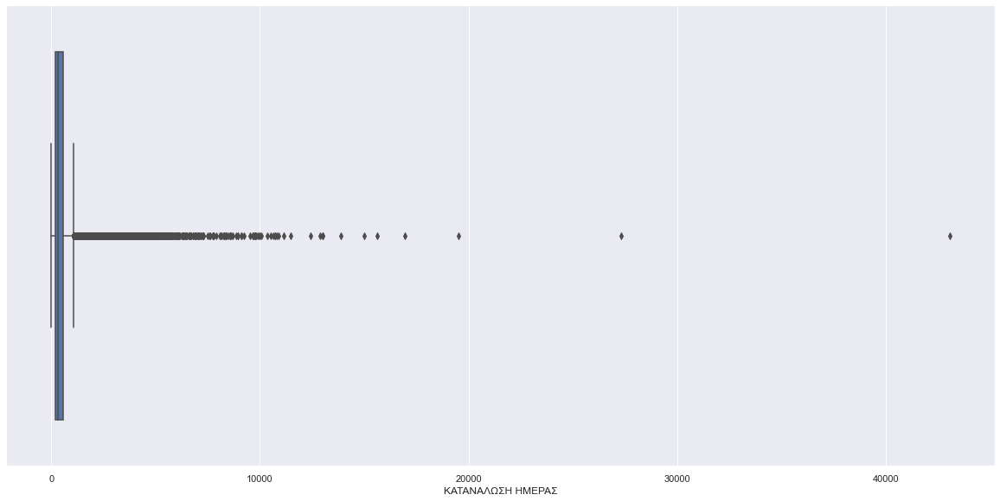

In [125]:
Start_boxplot('ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ')

Get all the customer IDs 

In [126]:
#customer_id=data['ΠΑΡΟΧΗ_2'].drop_duplicates()

1st method -> outliers will be replaced with the moving average of the 6 previous periods.Problem: extreme outliers affect the mean so the outlier still remains.

In [127]:
#for i in customer_id:
# Q1 = data.loc[data['ΠΑΡΟΧΗ_2']==i,['ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ']].quantile(0.25)[0]
# Q3 = data.loc[data['ΠΑΡΟΧΗ_2']==i,['ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ']].quantile(0.75)[0]
# IQR = Q3 - Q1
# data.loc[data['ΠΑΡΟΧΗ_2']==i,'ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ']=np.where(data.loc[data['ΠΑΡΟΧΗ_2']==i,'ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ']>data.loc[data['ΠΑΡΟΧΗ_2']==i,['ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ']].quantile(0.75)[0]+1.5*IQR,data.loc[data['ΠΑΡΟΧΗ_2']==i,'ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ'].rolling(6,min_periods=1).mean(),data.loc[data['ΠΑΡΟΧΗ_2']==i,'ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ'])
# data.loc[data['ΠΑΡΟΧΗ_2']==i,'ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ']=np.where(data.loc[data['ΠΑΡΟΧΗ_2']==i,'ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ']<data.loc[data['ΠΑΡΟΧΗ_2']==i,['ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ']].quantile(0.25)[0]-1.5*IQR,data.loc[data['ΠΑΡΟΧΗ_2']==i,'ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ'].rolling(6,min_periods=1).mean(),data.loc[data['ΠΑΡΟΧΗ_2']==i,'ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ'])

2nd method -> outliers will be replaced with  Q3+IQR*1.5 and Q1-IQR*1.5 respectively (for each customer)

In [128]:
#for i in customer_id:
# Q1 = data.loc[data['ΠΑΡΟΧΗ_2']==i,['ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ']].quantile(0.25)[0]
# Q3 = data.loc[data['ΠΑΡΟΧΗ_2']==i,['ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ']].quantile(0.75)[0]
# IQR = Q3 - Q1
# UB=Q3+1.5*IQR #upper bound
# LB=Q1-1.5*IQR
# data.loc[data['ΠΑΡΟΧΗ_2']==i,'ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ']=np.where(data.loc[data['ΠΑΡΟΧΗ_2']==i,'ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ']>UB,UB,data.loc[data['ΠΑΡΟΧΗ_2']==i,'ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ'])
# data.loc[data['ΠΑΡΟΧΗ_2']==i,'ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ']=np.where(data.loc[data['ΠΑΡΟΧΗ_2']==i,'ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ']<LB,LB,data.loc[data['ΠΑΡΟΧΗ_2']==i,'ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ'])

Daily consumption is showing plently of outliers. 

count    126139.000000
mean        425.414352
std         308.052027
min           0.000000
25%         205.000000
50%         326.000000
75%         557.000000
max        1085.000000
Name: ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ, dtype: float64


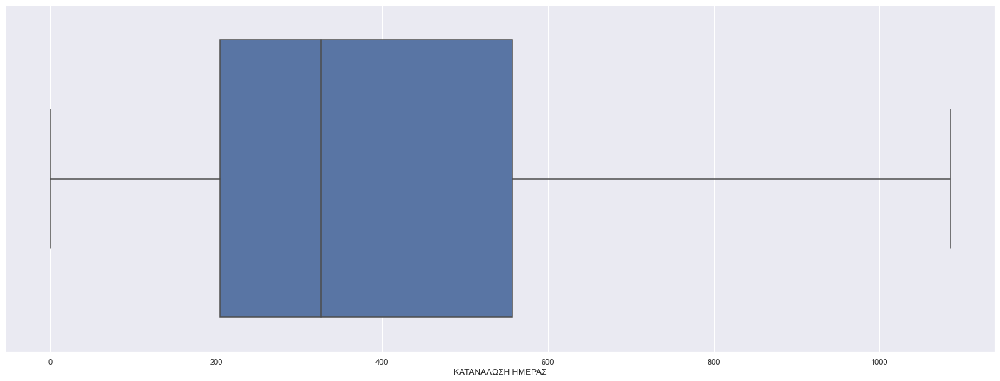

In [129]:
Fix_boxplot('ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ')

count    126139.000000
mean        101.273949
std         174.741553
min       -5337.160000
25%          38.620000
50%          61.010000
75%         103.685000
max       15631.400000
Name: ΠΛΗΡΩΤΕΟ, dtype: float64


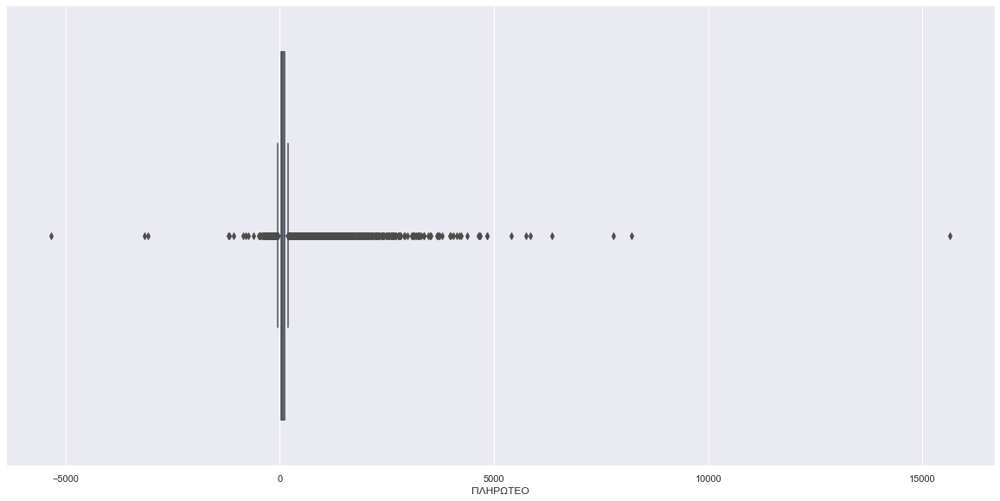

In [130]:
Start_boxplot('ΠΛΗΡΩΤΕΟ')

In [131]:
#Fix_boxplot('ΠΛΗΡΩΤΕΟ')

Some negative values still remain --> They will be removed since they dont make sense. 

In [132]:
data.loc[data['ΠΛΗΡΩΤΕΟ']>2000,'ΠΛΗΡΩΤΕΟ']=2000

In [133]:
data.loc[data['ΠΛΗΡΩΤΕΟ']<0,'ΠΛΗΡΩΤΕΟ']=0

count    126139.000000
mean        101.089486
std         149.120487
min           0.000000
25%          38.620000
50%          61.010000
75%         103.685000
max        2000.000000
Name: ΠΛΗΡΩΤΕΟ, dtype: float64


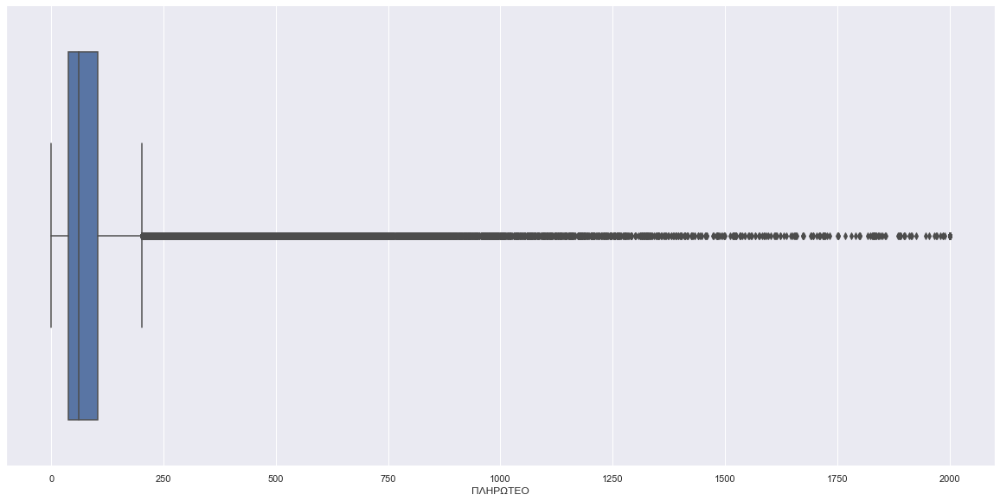

In [134]:
Start_boxplot('ΠΛΗΡΩΤΕΟ')

For ΠΛΗΡΩΤΕΟ the IQR method wont be used. The reason is that it will remove a lot of important data such as debts from 300 euros and higher , which is not correct. Instead we will 1) turn the negative values to zeroes since they dont make sense , 2) place a cap on the which will be 2000 euros.

boxplot is looking ok now

count    126139.000000
mean         18.150189
std         114.002794
min       -5393.520000
25%           0.000000
50%           0.000000
75%           0.000000
max        7779.040000
Name: ΠΡΟΗΓΟΥΜΕΝΟ ΑΝΕΞΟΦΛΗΤΟ, dtype: float64


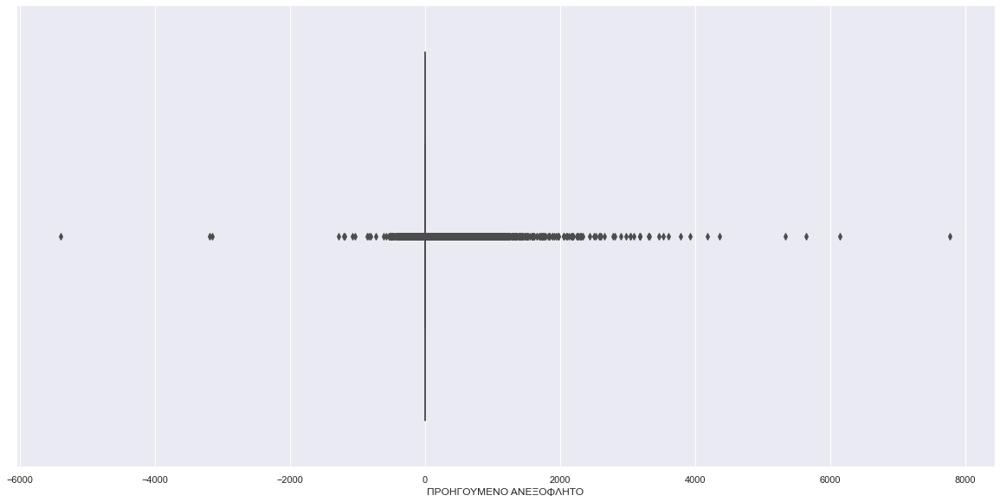

In [135]:
Start_boxplot('ΠΡΟΗΓΟΥΜΕΝΟ ΑΝΕΞΟΦΛΗΤΟ')

Negative values will be removed

In [136]:
data.loc[data['ΠΡΟΗΓΟΥΜΕΝΟ ΑΝΕΞΟΦΛΗΤΟ']<0,'ΠΡΟΗΓΟΥΜΕΝΟ ΑΝΕΞΟΦΛΗΤΟ']=0

Values above 2000 will be removed since they are considered 'extreme'.

In [137]:
data.loc[data['ΠΡΟΗΓΟΥΜΕΝΟ ΑΝΕΞΟΦΛΗΤΟ']>2000,'ΠΡΟΗΓΟΥΜΕΝΟ ΑΝΕΞΟΦΛΗΤΟ']=2000

For ΠΡΟΗΓΟΥΜΕΝΟ ΑΝΕΞΟΦΛΗΤΟ IQR wont be used since all the quantiles are zero. This makes sense since most customers dont have debt. So in this instance we will put a cap of 2000 euros.

count    126139.000000
mean         20.146045
std          97.987663
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max        2000.000000
Name: ΠΡΟΗΓΟΥΜΕΝΟ ΑΝΕΞΟΦΛΗΤΟ, dtype: float64


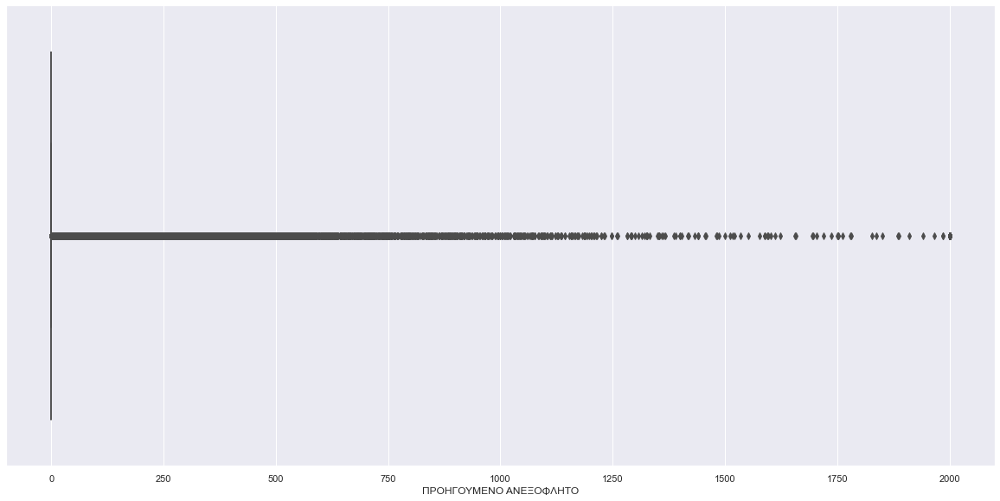

In [138]:
Start_boxplot('ΠΡΟΗΓΟΥΜΕΝΟ ΑΝΕΞΟΦΛΗΤΟ')

count    126139.000000
mean         99.502057
std         261.851870
min           0.000000
25%           0.000000
50%           0.000000
75%         112.000000
max       14787.000000
Name: ΚΑΤΑΝΑΛΩΣΗ ΝΥΧΤΑΣ, dtype: float64


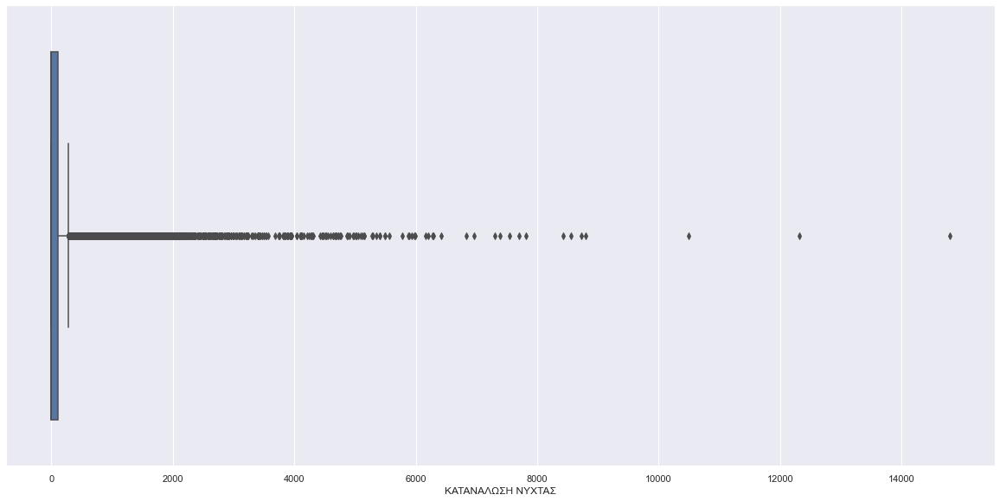

In [139]:
Start_boxplot('ΚΑΤΑΝΑΛΩΣΗ ΝΥΧΤΑΣ')

count    126139.000000
mean         66.545612
std          94.873199
min           0.000000
25%           0.000000
50%           0.000000
75%         112.000000
max         280.000000
Name: ΚΑΤΑΝΑΛΩΣΗ ΝΥΧΤΑΣ, dtype: float64


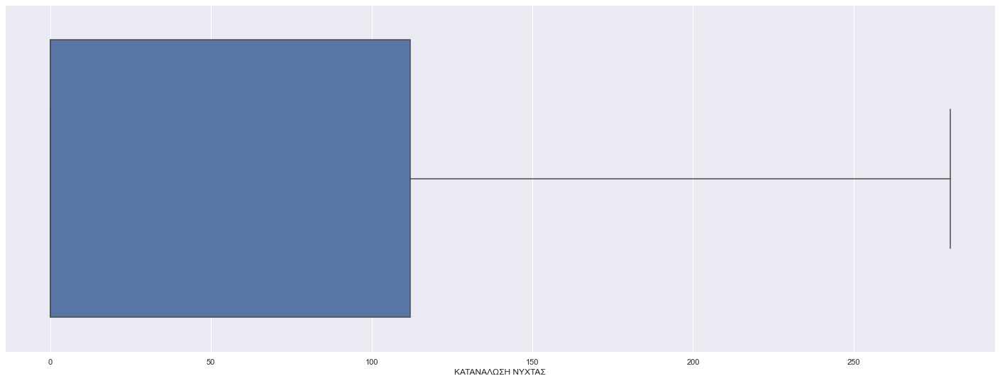

In [140]:
Fix_boxplot('ΚΑΤΑΝΑΛΩΣΗ ΝΥΧΤΑΣ')

Fix ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ

count    126139.000000
mean          8.330707
std          84.594158
min       -1059.000000
25%          -6.000000
50%           0.000000
75%           0.000000
max        2195.000000
Name: ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ, dtype: float64


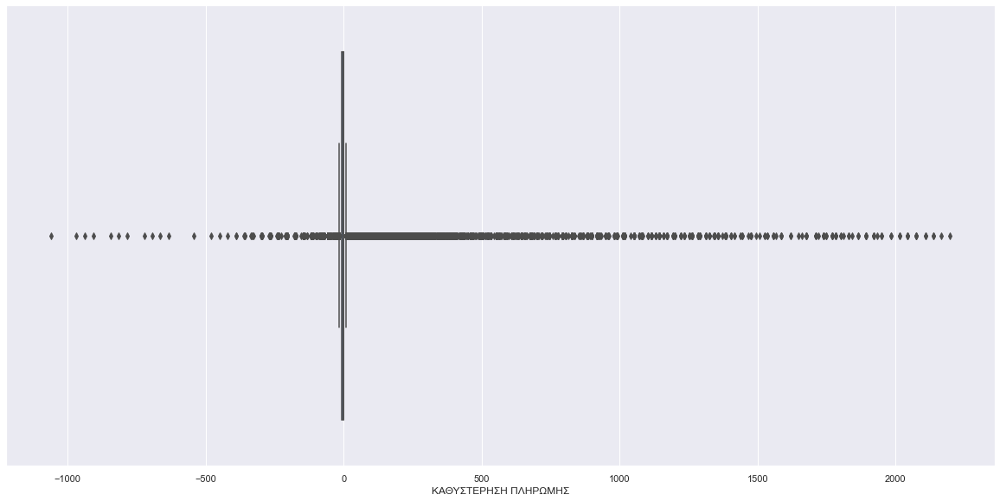

In [141]:
Start_boxplot('ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ')

In [142]:
data.loc[data['ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ']<0,'ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ']=0

count    126139.000000
mean         13.036111
std          82.646736
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max        2195.000000
Name: ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ, dtype: float64


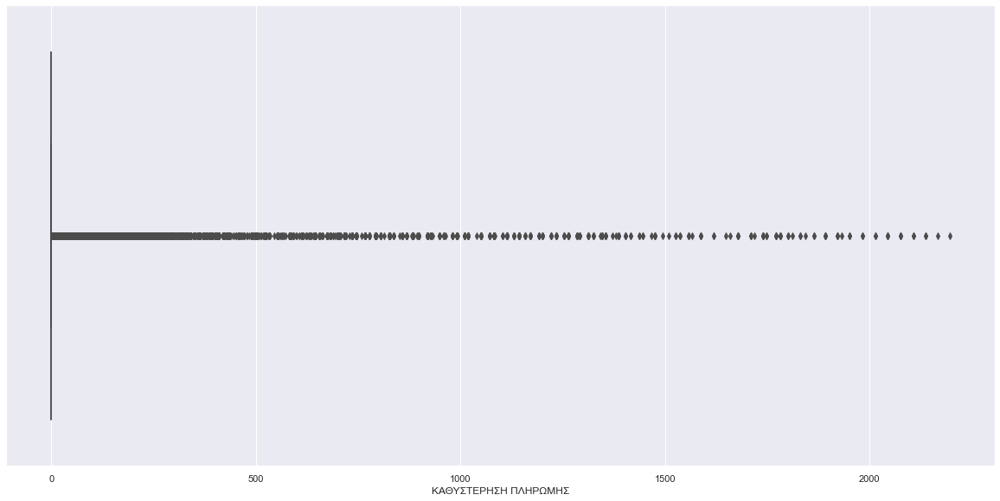

In [143]:
Start_boxplot('ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ')

In [144]:
len(data[data['ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ']>180]) 

1818

ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ will be capped at 180 days (6 months) . Once again all quantiles are zero , which is normal in this case.

In [145]:
data.loc[data['ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ']>180,'ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ']=180

count    126139.000000
mean          7.857134
std          28.229693
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max         180.000000
Name: ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ, dtype: float64


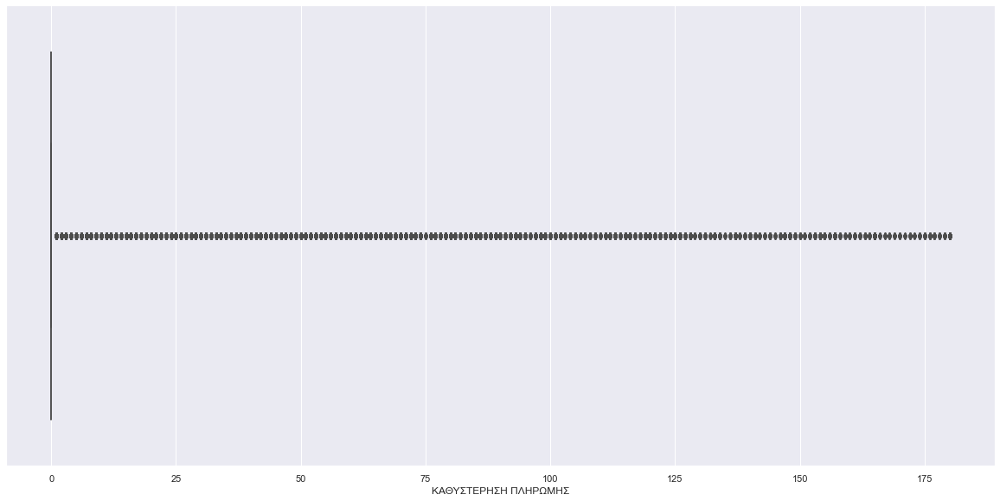

In [146]:
Start_boxplot('ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ')

Fix ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ

count    126139.000000
mean          0.097734
std           0.015897
min           0.000000
25%           0.089800
50%           0.094300
75%           0.110280
max           0.500000
Name: ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ, dtype: float64


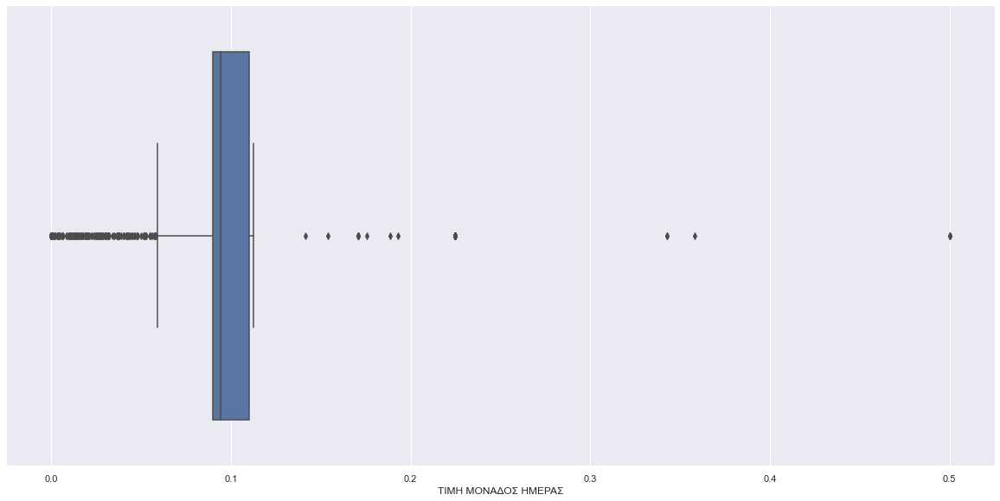

In [147]:
Start_boxplot('ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ')

count    126139.000000
mean          0.098541
std           0.011346
min           0.059080
25%           0.089800
50%           0.094300
75%           0.110280
max           0.141000
Name: ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ, dtype: float64


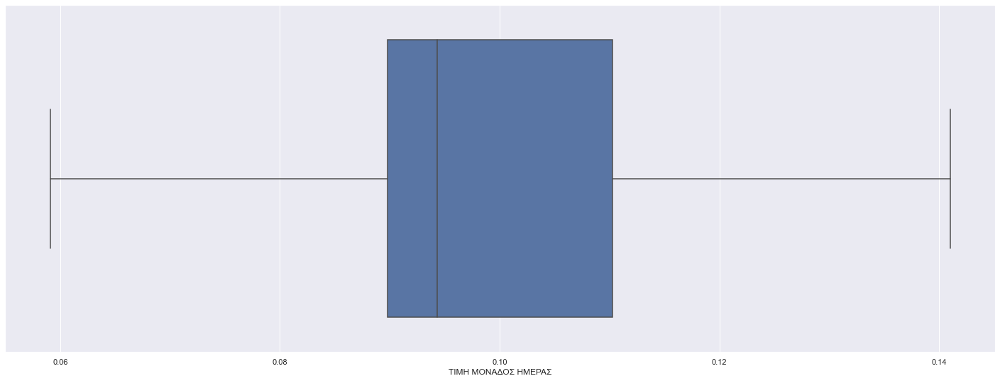

In [148]:
Fix_boxplot('ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ')

FEATURE ENGINEERING

STRATEGY: We are given all the transactions of customers for the past 5 years. That means we have sparse time-series data. 1) As a first step we will delete all entries after the first time a customer defaults. 2) Next we are going to create a new data table with new features extracted from the original data. The reason we do this is because if we use the original data in its current state (time series) the algorithm will classify transactions and not customers. Therefore the new table will contain new features that will represent the old ones extracted from the original data. 

Delete the entries of each customer after the first default 

In [149]:
for i in defaults:
    index_to_drop=data[(data['ΠΑΡΟΧΗ_2']==i) & (data['start of default']==1)].index[0]
    data.loc[data['ΠΑΡΟΧΗ_2']==i,'start of default']=np.where(data[data['ΠΑΡΟΧΗ_2']==i]['start of default'].index>index_to_drop,5,data[data['ΠΑΡΟΧΗ_2']==i]['start of default'])
    data.drop(data[data['start of default']==5].index,inplace=True) ### to 5 το εχω βαλει τυχαια σαν δεικτη απλα για να ξερω ποια τιμη να κανω drop μετα.
    

In [150]:
d_matrix=data.copy(deep=True)
d_matrix=d_matrix.drop_duplicates('ΠΑΡΟΧΗ_2')
d_matrix.drop(d_matrix.columns.difference(['ΠΑΡΟΧΗ_2','ΕΠΩΝΥΜΙΑ_2']),1,inplace=True)
d_matrix=d_matrix.reset_index()

Redefine unique paroxes

In [151]:
unique_paroxes=data['ΠΑΡΟΧΗ_2'].copy(deep=True).drop_duplicates()

Create the new table with the new extracted features. From now on we will work with d_matrix (design matrix)

In [152]:
def create_col_with_avg(new_col_name,col_from_data):
 d_matrix[new_col_name]=0
 for i in (unique_paroxes):
    d_matrix.loc[d_matrix['ΠΑΡΟΧΗ_2']==i,new_col_name]=data.loc[data['ΠΑΡΟΧΗ_2']==i,col_from_data].mean()


In [153]:
create_col_with_avg('avg_open_balance','ΑΝΟΙΧΤΟ ΥΠΟΛΟΙΠΟ')

In [154]:
create_col_with_avg('avg ΤΙΜΟΛΟΓΗΘΕΝ ΠΟΣΟ','ΤΙΜΟΛΟΓΗΘΕΝ ΠΟΣΟ')

In [155]:
create_col_with_avg('avg_daily_consumption','ΚΑΤΑΝΑΛΩΣΗ ΗΜΕΡΑΣ')

In [156]:
create_col_with_avg('avg_night_consumption','ΚΑΤΑΝΑΛΩΣΗ ΝΥΧΤΑΣ')

In [157]:
create_col_with_avg('avg_total_amount','ΣΥΝΟΛΙΚΟ ΠΟΣΟ')

In [158]:
create_col_with_avg('avg_delay','ΚΑΘΥΣΤΕΡΗΣΗ ΠΛΗΡΩΜΗΣ')

In [159]:
create_col_with_avg('avg_energy_total','ΣΥΝΟΛΟ ΕΝΕΡΓΕΙΑΣ')

In [160]:
create_col_with_avg('avg_total_bill_amount','ΣΥΝΟΛΟ ΛΟΓΑΡΙΑΣΜΟΥ')

In [161]:
create_col_with_avg('avg_previous_unpaid','ΠΡΟΗΓΟΥΜΕΝΟ ΑΝΕΞΟΦΛΗΤΟ')

In [162]:
create_col_with_avg('avg_ΠΛΗΡΩΤΕΟ','ΠΛΗΡΩΤΕΟ')

In [163]:
create_col_with_avg('avg ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ','ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ')

In [164]:
create_col_with_avg('avg ΥΠΟΛΟΙΠΟ ΕΝΕΡΓΕΙΑΣ','ΥΠΟΛΟΙΠΟ ΕΝΕΡΓΕΙΑΣ')

In [165]:
d_matrix['ΤΕΛΙΚΟΣ']=0
for i in (unique_paroxes):
    d_matrix.loc[d_matrix['ΠΑΡΟΧΗ_2']==i,'ΤΕΛΙΚΟΣ']=np.where(data.loc[data['ΠΑΡΟΧΗ_2']==i,'ΤΕΛΙΚΟΣ'].sum()>0,1,0)

In [166]:
d_matrix['unpaid_ratio']=0
for i in (unique_paroxes):
    d_matrix.loc[d_matrix['ΠΑΡΟΧΗ_2']==i,'unpaid_ratio']=data.loc[data['ΠΑΡΟΧΗ_2']==i,'missed_payment'].sum()/len(data.loc[data['ΠΑΡΟΧΗ_2']==i,'missed_payment'])

In [167]:
d_matrix['ΣΥΝΕΡΓΑΤΗΣ']=0
for i in (unique_paroxes):
    d_matrix.loc[d_matrix['ΠΑΡΟΧΗ_2']==i,'ΣΥΝΕΡΓΑΤΗΣ']=data.loc[data['ΠΑΡΟΧΗ_2']==i,'ΣΥΝΕΡΓΑΤΗΣ'].unique()[0]

In [168]:
d_matrix['DTM2']=0
for i in (unique_paroxes):
    d_matrix.loc[d_matrix['ΠΑΡΟΧΗ_2']==i,'DTM2']=data.loc[data['ΠΑΡΟΧΗ_2']==i,'DTM2'].value_counts().reset_index().iloc[0,0]

In [169]:
d_matrix['ΔΙΑΣΤΗΜΑ ΣΥΝΕΡΓΑΣΙΑΣ']=0
for i in (unique_paroxes):
    d_matrix.loc[d_matrix['ΠΑΡΟΧΗ_2']==i,'ΔΙΑΣΤΗΜΑ ΣΥΝΕΡΓΑΣΙΑΣ']=len(data.loc[data['ΠΑΡΟΧΗ_2']==i])

In [170]:
d_matrix['ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ']=0
for i in (unique_paroxes):
    d_matrix.loc[d_matrix['ΠΑΡΟΧΗ_2']==i,'ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ']=data.loc[data['ΠΑΡΟΧΗ_2']==i,'ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ'].tail(1).iloc[0]

In order to get the number of defaults of each client we will sum the column start of default for each id

In [171]:
d_matrix['number of defaults']=0
for i in (unique_paroxes):
     d_matrix.loc[d_matrix['ΠΑΡΟΧΗ_2']==i,'number of defaults']=data[data['ΠΑΡΟΧΗ_2']==i]['start of default'].sum()

In [172]:
d_matrix['number of contracts']=0
for i in (unique_paroxes):
     d_matrix.loc[d_matrix['ΠΑΡΟΧΗ_2']==i,'number of contracts']=data[data['ΠΑΡΟΧΗ_2']==i]['ΗΜΕΡΟΜΗΝΙΑ ΛΗΞΗΣ ΣΥΜΒΟΛΑΙΟΥ'].nunique()

In [173]:
d_matrix['number of contracts'].value_counts()

1    3205
2    1510
3     119
0       5
4       1
Name: number of contracts, dtype: int64

Set as responce variable if someone has defaulted

In [174]:
d_matrix['Defaulter']=0
d_matrix['Defaulter']=np.where(d_matrix['number of defaults']>0,1,0)

In [175]:
d_matrix.head()

,index,ΕΠΩΝΥΜΙΑ_2,ΠΑΡΟΧΗ_2,avg_open_balance,avg ΤΙΜΟΛΟΓΗΘΕΝ ΠΟΣΟ,avg_daily_consumption,avg_night_consumption,avg_total_amount,avg_delay,avg_energy_total,avg_total_bill_amount,avg_previous_unpaid,avg_ΠΛΗΡΩΤΕΟ,avg ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ,avg ΥΠΟΛΟΙΠΟ ΕΝΕΡΓΕΙΑΣ,ΤΕΛΙΚΟΣ,unpaid_ratio,ΣΥΝΕΡΓΑΤΗΣ,DTM2,ΔΙΑΣΤΗΜΑ ΣΥΝΕΡΓΑΣΙΑΣ,ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ,number of defaults,number of contracts,Defaulter
0,0,3598,0004cc2d83569bfc0a711946e0f3cd71,0.000000,89.943000,476.100000,0.0,89.943000,12.500000,50.730000,89.943000,66.537500,154.836000,0.110280,0.0000,0,0.000000,partner_4,102.0,20,3,0,1,0
1,20,4105,000d5cfd2c57adb31ec90554791e8201,2.619167,65.395000,453.500000,0.0,65.395000,59.750000,32.294167,65.395000,71.450833,136.845833,0.110280,1.5875,0,0.166667,partner_44,52.0,12,2,1,1,1
2,33,2126,000ee5a9cbf6c07cd316fc23ee937439,0.000000,96.579583,611.916667,0.0,96.579583,0.000000,33.540833,96.579583,0.000000,96.579583,0.090174,0.0000,0,0.000000,partner_9,159.0,24,8,0,1,0
3,57,1032,001d11be0d6e7d79716c3d04072dcf58,0.000000,49.752778,309.444444,0.0,49.752778,0.333333,25.598333,49.752778,0.000000,48.294444,0.110280,0.0000,0,0.000000,partner_9,65.0,18,3,0,1,0
4,75,1294,0039ab1d833068e4443b19a4270ebad6,7.432500,39.945000,162.000000,0.0,39.945000,120.500000,11.670000,39.945000,57.437500,97.382500,0.090800,5.9525,0,0.250000,partner_5,53.0,4,1,0,1,0


Pearson correlation: Features with correlation > 0.85 will be removed in order to avoid multicollinearity.

Text(0.5, 1.0, 'Triangle Correlation')

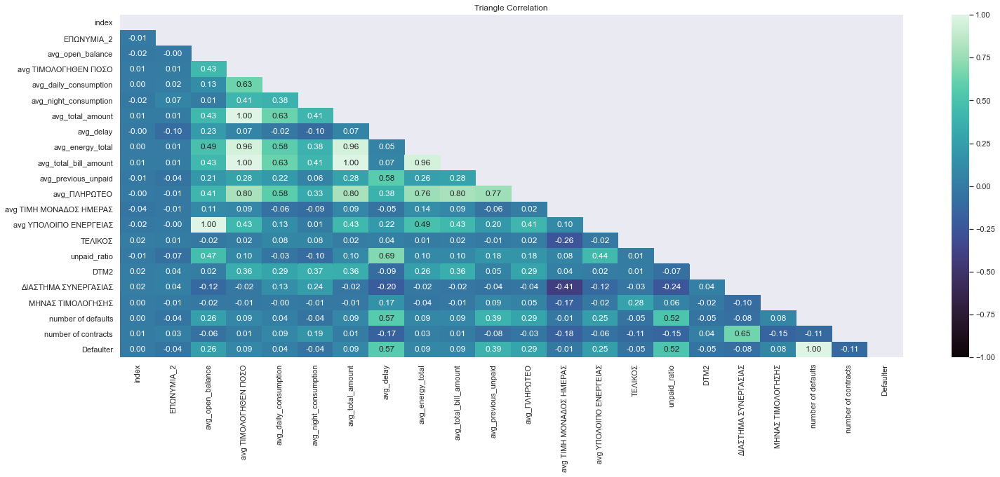

In [177]:
mask = np.triu(np.ones_like(d_matrix.corr(), dtype=bool))
sns.set(rc = {'figure.figsize':(25,9)})
heatmap = sns.heatmap(d_matrix.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='mako',fmt='.2f')
heatmap.set_title('Triangle Correlation')

From the above graph we can see the relationship that the response variable (if someone has defaulted) has with the rest of the features. It is expected that avg_delay (0.57) , unpaid_ratio (0.52) and avg_previous_unpaid (0.39) have the highest correlation with the response variable and therefore they have the most predictive power. Note: number of defaults will be removed since it basicaly is a renamed version of Defaulter.

We remove features that are highly correlated.

Create a design matrix and choose which variables to keep ---> from now on we will work with d_matrix2

In [178]:
d_matrix.head()

,index,ΕΠΩΝΥΜΙΑ_2,ΠΑΡΟΧΗ_2,avg_open_balance,avg ΤΙΜΟΛΟΓΗΘΕΝ ΠΟΣΟ,avg_daily_consumption,avg_night_consumption,avg_total_amount,avg_delay,avg_energy_total,avg_total_bill_amount,avg_previous_unpaid,avg_ΠΛΗΡΩΤΕΟ,avg ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ,avg ΥΠΟΛΟΙΠΟ ΕΝΕΡΓΕΙΑΣ,ΤΕΛΙΚΟΣ,unpaid_ratio,ΣΥΝΕΡΓΑΤΗΣ,DTM2,ΔΙΑΣΤΗΜΑ ΣΥΝΕΡΓΑΣΙΑΣ,ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ,number of defaults,number of contracts,Defaulter
0,0,3598,0004cc2d83569bfc0a711946e0f3cd71,0.000000,89.943000,476.100000,0.0,89.943000,12.500000,50.730000,89.943000,66.537500,154.836000,0.110280,0.0000,0,0.000000,partner_4,102.0,20,3,0,1,0
1,20,4105,000d5cfd2c57adb31ec90554791e8201,2.619167,65.395000,453.500000,0.0,65.395000,59.750000,32.294167,65.395000,71.450833,136.845833,0.110280,1.5875,0,0.166667,partner_44,52.0,12,2,1,1,1
2,33,2126,000ee5a9cbf6c07cd316fc23ee937439,0.000000,96.579583,611.916667,0.0,96.579583,0.000000,33.540833,96.579583,0.000000,96.579583,0.090174,0.0000,0,0.000000,partner_9,159.0,24,8,0,1,0
3,57,1032,001d11be0d6e7d79716c3d04072dcf58,0.000000,49.752778,309.444444,0.0,49.752778,0.333333,25.598333,49.752778,0.000000,48.294444,0.110280,0.0000,0,0.000000,partner_9,65.0,18,3,0,1,0
4,75,1294,0039ab1d833068e4443b19a4270ebad6,7.432500,39.945000,162.000000,0.0,39.945000,120.500000,11.670000,39.945000,57.437500,97.382500,0.090800,5.9525,0,0.250000,partner_5,53.0,4,1,0,1,0


In [179]:
d_matrix2=d_matrix.copy(deep=True)

In [180]:
d_matrix2.drop(d_matrix2.columns.difference(['ΤΕΛΙΚΟΣ','ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ','avg_night_consumption','avg ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ','ΔΙΑΣΤΗΜΑ ΣΥΝΕΡΓΑΣΙΑΣ','avg_open_balance','avg_bill_amount','avg_daily_consumption','unpaid_ratio','avg_previous_unpaid','avg_delay','DTM2','number of contracts','Defaulter']),1,inplace=True)

Fix number of contracts --> some are zero --> set them to 1

In [181]:
d_matrix2[d_matrix2['number of contracts']==0]

,avg_open_balance,avg_daily_consumption,avg_night_consumption,avg_delay,avg_previous_unpaid,avg ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ,ΤΕΛΙΚΟΣ,unpaid_ratio,DTM2,ΔΙΑΣΤΗΜΑ ΣΥΝΕΡΓΑΣΙΑΣ,ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ,number of contracts,Defaulter
397,0.0,336.222222,95.111111,9.777778,25.602222,0.091215,1,0.0,45.0,9,1,0,0
692,0.0,173.500000,0.000000,0.000000,0.000000,0.090327,1,0.0,65.0,12,10,0,0
2218,0.0,468.846154,69.615385,0.307692,0.000000,0.090805,1,0.0,65.0,13,5,0,0
2776,0.0,789.476190,91.380952,2.333333,14.160000,0.092748,0,0.0,82.0,21,8,0,0
4123,0.0,214.500000,68.500000,0.875000,0.000000,0.089800,0,0.0,24.0,8,10,0,0


Length of cooperation for those that have number of contracts 0 is less that 2 years so they will be replaced with 1 contract.

In [182]:
d_matrix2['number of contracts']=np.where(d_matrix2['number of contracts']==0,1,d_matrix2['number of contracts']) ### Fix 0 number of contracts

In [183]:
d_matrix2.head()

,avg_open_balance,avg_daily_consumption,avg_night_consumption,avg_delay,avg_previous_unpaid,avg ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ,ΤΕΛΙΚΟΣ,unpaid_ratio,DTM2,ΔΙΑΣΤΗΜΑ ΣΥΝΕΡΓΑΣΙΑΣ,ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ,number of contracts,Defaulter
0,0.000000,476.100000,0.0,12.500000,66.537500,0.110280,0,0.000000,102.0,20,3,1,0
1,2.619167,453.500000,0.0,59.750000,71.450833,0.110280,0,0.166667,52.0,12,2,1,1
2,0.000000,611.916667,0.0,0.000000,0.000000,0.090174,0,0.000000,159.0,24,8,1,0
3,0.000000,309.444444,0.0,0.333333,0.000000,0.110280,0,0.000000,65.0,18,3,1,0
4,7.432500,162.000000,0.0,120.500000,57.437500,0.090800,0,0.250000,53.0,4,1,1,0


Lets see if the features we chose are correlated

Text(0.5, 1.0, 'Triangle Correlation')

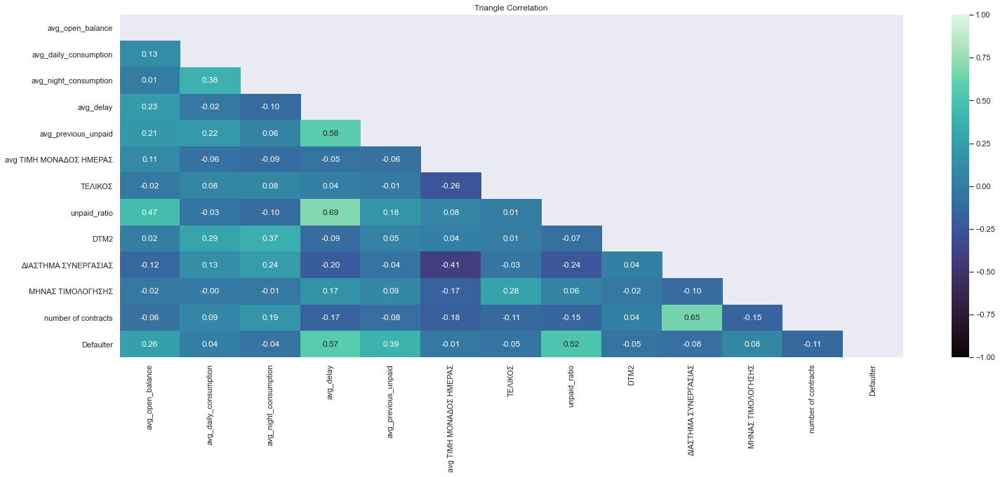

In [184]:
mask = np.triu(np.ones_like(d_matrix2.corr(), dtype=bool))
sns.set(rc = {'figure.figsize':(25,9)})
heatmap = sns.heatmap(d_matrix2.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='mako',fmt='.2f')
heatmap.set_title('Triangle Correlation')

Some features are correlated but none are above 0.85 which is our threshold, so we keep all of them.

Initial Feature Selection : Numerical features

In [185]:
pd.DataFrame(
    [scipy.stats.pearsonr(d_matrix2.drop(['Defaulter'], axis = 1)[col], 
    d_matrix2['Defaulter']) for col in d_matrix2.drop(['Defaulter'], axis = 1)], 
    columns=["Pearson Corr.", "p-value"], 
    index=d_matrix2.drop(['Defaulter'], axis = 1).columns,
).round(4)

,Pearson Corr.,p-value
avg_open_balance,0.2637,0.0000
avg_daily_consumption,0.0375,0.0091
avg_night_consumption,-0.0424,0.0031
avg_delay,0.5653,0.0000
avg_previous_unpaid,0.3937,0.0000
avg ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ,-0.0111,0.4393
ΤΕΛΙΚΟΣ,-0.0518,0.0003
unpaid_ratio,0.5183,0.0000
DTM2,-0.0541,0.0002
ΔΙΑΣΤΗΜΑ ΣΥΝΕΡΓΑΣΙΑΣ,-0.0823,0.0000


Keep only features with : p-value < 0.05

In [186]:
d_matrix2=d_matrix2.drop(['avg ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ'],axis=1)

Model Building

One hot encoding

In [187]:
from sklearn.preprocessing import OneHotEncoder
enc=OneHotEncoder()
enc_data=pd.DataFrame(enc.fit_transform(d_matrix2[['number of contracts','ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ']]).toarray())

In [188]:
one_hot_encoded_data = pd.get_dummies(d_matrix2, columns = ['number of contracts','ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ'])

In [189]:
d_matrix2=one_hot_encoded_data

In [190]:
d_matrix2.head()

,avg_open_balance,avg_daily_consumption,avg_night_consumption,avg_delay,avg_previous_unpaid,ΤΕΛΙΚΟΣ,unpaid_ratio,DTM2,ΔΙΑΣΤΗΜΑ ΣΥΝΕΡΓΑΣΙΑΣ,Defaulter,number of contracts_1,number of contracts_2,number of contracts_3,number of contracts_4,ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_1,ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_2,ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_3,ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_4,ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_5,ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_6,ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_7,ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_8,ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_9,ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_10,ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_11,ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_12
0,0.000000,476.100000,0.0,12.500000,66.537500,0,0.000000,102.0,20,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1,2.619167,453.500000,0.0,59.750000,71.450833,0,0.166667,52.0,12,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,0.000000,611.916667,0.0,0.000000,0.000000,0,0.000000,159.0,24,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,0.000000,309.444444,0.0,0.333333,0.000000,0,0.000000,65.0,18,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
4,7.432500,162.000000,0.0,120.500000,57.437500,0,0.250000,53.0,4,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


Categorical data selection : keep features with p-value < 0.05

In [191]:
Xcat = d_matrix2.select_dtypes(exclude=['int64','float64']).copy()
Xcat=Xcat.drop(['Defaulter'],axis=1)
ycat=d_matrix2['Defaulter']

In [192]:
for col in Xcat.columns:
    table = pd.crosstab(Xcat[col], ycat)
    print()
    display(table)
    _, pval, _, expected_table = scipy.stats.chi2_contingency(table)
    print(f"p-value: {pval:.25f}")

Defaulter,0,1
number of contracts_1,,
0,1566,64
1,2869,341


p-value: 0.0000000000000028645962724



Defaulter,0,1
number of contracts_2,,
0,2986,344
1,1449,61


p-value: 0.0000000000003693796499312



Defaulter,0,1
number of contracts_3,,
0,4319,402
1,116,3


p-value: 0.0304184359374360807626303



Defaulter,0,1
number of contracts_4,,
0,4434,405
1,1,0


p-value: 1.0000000000000000000000000



Defaulter,0,1
ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_1,,
0,4290,368
1,145,37


p-value: 0.0000000064690018448220111



Defaulter,0,1
ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_2,,
0,4272,367
1,163,38


p-value: 0.0000000741367841927609898



Defaulter,0,1
ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_3,,
0,3862,347
1,573,58


p-value: 0.4687672570763994350784287



Defaulter,0,1
ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_4,,
0,1848,308
1,2587,97


p-value: 0.0000000000000000000000000



Defaulter,0,1
ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_5,,
0,4252,384
1,183,21


p-value: 0.3755780322538443405377961



Defaulter,0,1
ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_6,,
0,4349,390
1,86,15


p-value: 0.0280525549134662613437463



Defaulter,0,1
ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_7,,
0,4342,386
1,93,19


p-value: 0.0016239779171126824276056



Defaulter,0,1
ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_8,,
0,4332,381
1,103,24


p-value: 0.0000290961802085331923938



Defaulter,0,1
ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_9,,
0,4343,382
1,92,23


p-value: 0.0000113898274047359383051



Defaulter,0,1
ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_10,,
0,4317,387
1,118,18


p-value: 0.0545629355306311916717910



Defaulter,0,1
ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_11,,
0,4289,376
1,146,29


p-value: 0.0001166775775482526659056



Defaulter,0,1
ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_12,,
0,4289,379
1,146,26


p-value: 0.0018430338828008482627424


Keep features with p-value < 0.05

In [193]:
d_matrix2=d_matrix2.drop(['number of contracts_4','ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_3','ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_5','ΜΗΝΑΣ ΤΙΜΟΛΟΓΗΣΗΣ_10'],axis=1)

Train test split

In [194]:
train_set, test_set = train_test_split(d_matrix2, test_size = 0.3,stratify=d_matrix2['Defaulter'])# ,random_state = seed)
X_train=train_set
X_test = test_set.drop(['Defaulter'], axis = 1)
y_test = test_set['Defaulter']
y_train = X_train['Defaulter']
X_train = X_train.drop(['Defaulter'], axis = 1)


Undersampling

In [195]:
rus = RandomUnderSampler(random_state=0) ####gia to undersampling
#ros = RandomOverSampler(sampling_strategy=1) ##### gia to oversampling
X_train, y_train = rus.fit_resample(X_train, y_train)

Feature Scaling

In [196]:
scaler = MinMaxScaler()
features_names = X_train.columns
X_train = scaler.fit_transform(X_train)
X_train = pd.DataFrame(X_train, columns = features_names)
X_test = scaler.transform(X_test)
X_test = pd.DataFrame(X_test, columns = features_names)

Logistic Regression

Create metric functions

In [197]:
def pr_curve(y_test,y_pred_prob,name):
 precision, recall, _ = precision_recall_curve(y_test, y_pred_prob.iloc[:,1])
 # plot the model precision-recall curve
 plt.plot(recall, precision, marker='.',lw=2)
# axis labels
 plt.xlabel('Recall')
 plt.ylabel('Precision')
 plt.title(name)
# show the legend
 plt.legend()
# show the plot
plt.show()

In [198]:
def conf_matrix(y_test,y_pred):
 conf_matrix = metrics.confusion_matrix(y_test,y_pred)# /y_test.size
 ax=plt.subplot()
 akws = {"va": 'baseline',"fontweight":'bold',"color":'black'}
 sns.heatmap(conf_matrix,annot=True,ax=ax,fmt='g',annot_kws=akws,cmap='Blues')
 ax.set_xlabel('Predicted labels'); ax.set_ylabel('True labels')
 ax.set_title('Confusion Matrix'); ax.set(yticks=[0, 2],xticks=[0.5, 1.5])
 ax.xaxis.set_ticklabels(['Not Default', 'Default']); ax.yaxis.set_ticklabels(['Not Default', 'Default']);

In [199]:
def cv_auc_roc(classifier_input):
 cv = StratifiedKFold(n_splits=10,shuffle=False)
 classifier = classifier_input
 tprs = []
 aucs = []
 mean_fpr = np.linspace(0, 1, 100)

 fig, ax = plt.subplots(figsize=(25,8))
 for i, (train, test) in enumerate(cv.split(X_train, y_train)):
    classifier.fit(X.iloc[train], y[train])
    viz = RocCurveDisplay.from_estimator(classifier, X.iloc[test],y[test],name="ROC fold {}".format(i),alpha=0.3, lw=1,ax=ax )
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

 ax.plot([0, 1], [0, 1], linestyle="--", lw=2, color="r", label="Chance", alpha=0.8)

 mean_tpr = np.mean(tprs, axis=0)
 mean_tpr[-1] = 1.0
 mean_auc = auc(mean_fpr, mean_tpr)
 std_auc = np.std(aucs)
 ax.plot(mean_fpr,mean_tpr,color="b",label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc), lw=2, alpha=0.8)
 std_tpr = np.std(tprs, axis=0)
 tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
 tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
 ax.fill_between(mean_fpr,tprs_lower,tprs_upper, color="grey", alpha=0.2,label=r"$\pm$ 1 std. dev.")
 ax.set( xlim=[-0.05, 1.05], ylim=[-0.05, 1.05], title="Cross Validation - Receiver operating characteristic")
 ax.legend(loc="lower right")
 plt.show()

In [200]:
def cross_validation_plot(df_X, Y,classifier_type, n_folds = 10):
    from numpy import interp
    plt.rcParams['axes.linewidth'] = 13 
    plt.rcParams['lines.linewidth'] =17
    # Defining the data + scaling
    #if isinstance(df_X, pd.DataFrame):
    #    X = scale(df_X.values)
    #else:
    #    X = scale(df_X)
    X=df_X
    scaler = MinMaxScaler()
    features_names = X.columns
    X = scaler.fit_transform(X)
    X = pd.DataFrame(X, columns = features_names)
    y = Y
    n_samples, n_features = X.shape
    # Classification and PR analysis
    # Run classifier with cross-validation and plot PR curves
    cv = StratifiedKFold(n_splits = n_folds , shuffle = True )
    classifier = classifier_type
    # defining the lists
    prs = []
    aucs = []
    mean_recall = np.linspace(0, 1, 100)
    plt.figure(figsize=(20 , 8))
    i = 0
    for train, test in cv.split(X, y):
        probas_ = classifier.fit(X.iloc[train], y[train]).predict_proba(X.iloc[test])
        # Compute PR curve and area the curve
        precision, recall, classifier_type = precision_recall_curve(y[test], probas_[:, 1])
        prs.append(interp(mean_recall, precision, recall))
        pr_auc = auc(recall, precision)
        aucs.append(pr_auc)
        plt.plot(recall, precision, lw=1, alpha=0.5, label='Fold %d #(AUCPR = %0.2f)' % (i+1, pr_auc))
        i += 1
    
    plt.plot([0, 1], [1, 0], linestyle='--', lw=3, color='k', label='Luck', alpha=.8)
    mean_precision = np.mean(prs, axis=0)
    mean_auc = auc(mean_recall, mean_precision)
    std_auc = np.std(aucs)
    plt.plot(mean_precision, mean_recall, color='navy',
             label=r'Mean (AUCPR = %0.3f $\pm$ %0.2f)' % (mean_auc, std_auc),
             lw=4)
    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    plt.xlabel('Recall' ,  fontweight = "bold" , fontsize=20)
    plt.ylabel('Precision',fontweight = "bold" , fontsize=20)
    plt.tick_params(axis='both', which='major', labelsize=15)
    plt.legend( prop={'size':10} , loc = 0)
    plt.title('Cross Validation PR-Curve',fontweight='bold',fontsize=15)
    plt.show()

Create subsets for Logistic regression model

In [201]:
X_train_lr=X_train.copy(deep=True)
y_train_lr=y_train.copy(deep=True)
X_test_lr=X_test.copy(deep=True)
y_test_lr=y_test.copy(deep=True)

Train the model

In [202]:
classifier_lr=LogisticRegression(random_state=0,max_iter=1000,class_weight = 'balanced')
result=classifier_lr.fit(X_train_lr,y_train_lr)

Perform Stratified K-Fold Cross Validation on the train set and get the F1 and PR-AUC results

In [203]:
#cv_auc_roc(classifier_lr)

In [204]:
sk_folds = StratifiedKFold(n_splits = 10)
scores = cross_val_score(classifier_lr, X_train_lr, np.ravel(y_train_lr), cv = sk_folds,scoring='f1')
print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())

Cross Validation Scores:  [0.76923077 0.85714286 0.81632653 0.90566038 0.77777778 0.85714286
 0.79310345 0.94736842 0.90566038 0.88461538]
Average CV Score:  0.8514028800567365


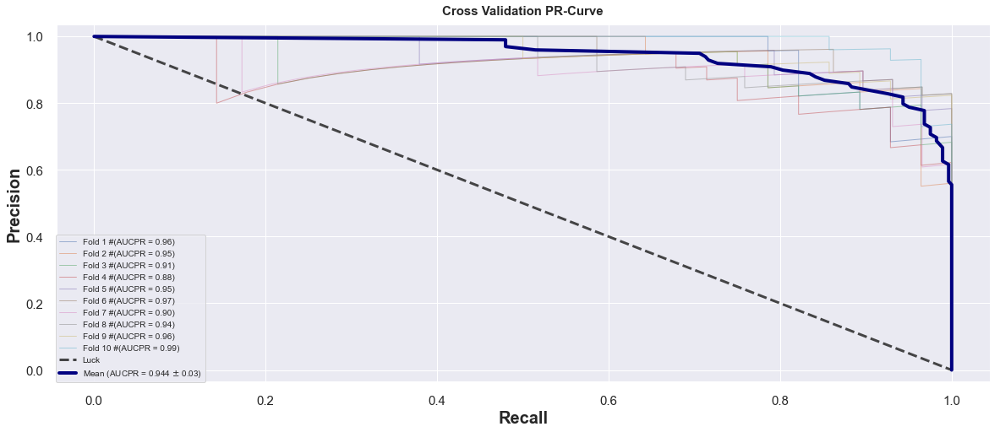

In [205]:
cross_validation_plot(X_train, np.ravel(y_train),classifier_lr, n_folds = 10)

In both cases cross validation model performance seems stable so we have increased confidense that the model can be generalized.

Test the model

In [206]:
y_pred_lr=classifier_lr.predict(X_test_lr)
y_pred_prob_lr = classifier_lr.predict_proba(X_test_lr)

In [207]:
#cm=confusion_matrix(y_test_lr,y_pred_lr)
#cm

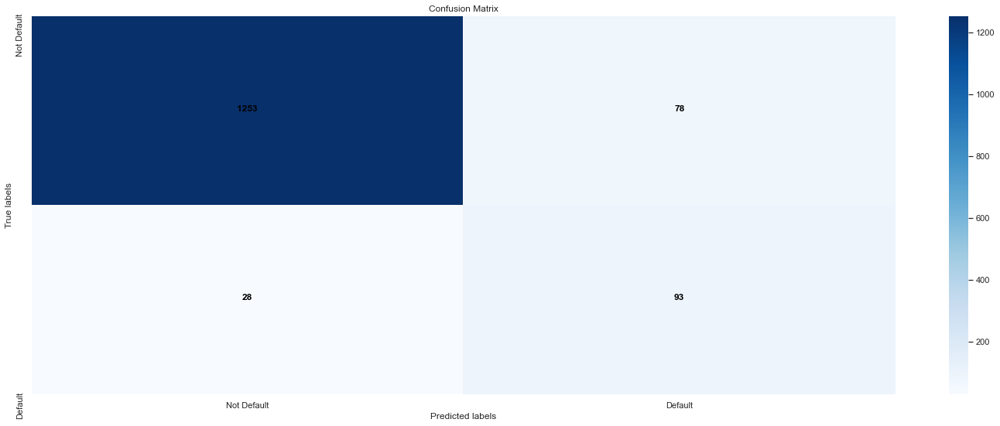

In [208]:
conf_matrix(y_test_lr,y_pred_lr)

In [209]:
print(classification_report(y_test_lr, y_pred_lr))

              precision    recall  f1-score   support

           0       0.98      0.94      0.96      1331
           1       0.54      0.77      0.64       121

    accuracy                           0.93      1452
   macro avg       0.76      0.85      0.80      1452
weighted avg       0.94      0.93      0.93      1452



Τα παρακάτω ειναι οι συντελεστες των ανεξαρτητων μεταβλητων στο logistic regression

In [210]:
#importance = classifier_lr.coef_[0]
#for i,v in enumerate(importance):
#	print('Feature: %0d, Score: %.5f' % (i,v))

In [211]:
y_test_lr=pd.DataFrame(y_test_lr)
X_test_lr=pd.DataFrame(X_test_lr)
y_test_lr=y_test_lr.reset_index()
X_test_lr=X_test_lr.reset_index()
y_test_lr=y_test_lr.drop('index',axis=1)
X_test_lr=X_test_lr.drop('index',axis=1)

In [212]:
#sm_model = sm.Logit(y_train_lr, sm.add_constant(X_train_lr)).fit(disp=0)
#print(sm_model.pvalues)
#sm_model.summary2() ###υπαρχει summary σκετο kai summary2

Get the probability of default for each customer

Create the transition matrix

In [213]:
y_pred_prob=pd.DataFrame(y_pred_prob_lr)
y_pred_prob['class']=y_test_lr
y_pred_prob.columns=['P(0)','P(1)','Class']

In [214]:
y_pred_prob.head(3)

,P(0),P(1),Class
0,0.635617,0.364383,0
1,0.872481,0.127519,0
2,0.597514,0.402486,1


In [215]:
transition_matrix=np.zeros((2,2))
transition_matrix[0,0]=y_pred_prob[y_pred_prob['Class']==1].mean()[0]
transition_matrix[0,1]=y_pred_prob[y_pred_prob['Class']==1].mean()[1]
transition_matrix[1,0]=y_pred_prob[y_pred_prob['Class']==0].mean()[0]
transition_matrix[1,1]=y_pred_prob[y_pred_prob['Class']==0].mean()[1]
transition_matrix=pd.DataFrame(transition_matrix)
transition_matrix.columns=['No Default','Default']
transition_matrix=transition_matrix.rename(index={0: "Defaulter", 1: "Not Defaulter"})

In [216]:
transition_matrix

,No Default,Default
Defaulter,0.289849,0.710151
Not Defaulter,0.738820,0.261180


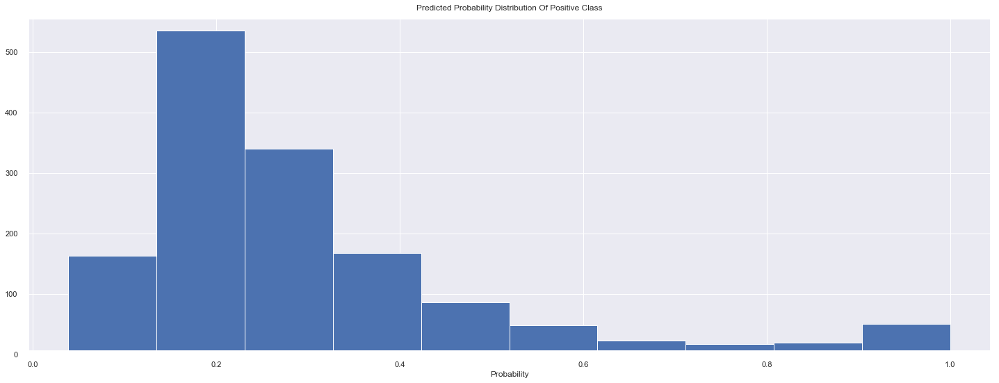

In [217]:
plt.hist(y_pred_prob_lr[:,1])
plt.title('Predicted Probability Distribution Of Positive Class')
plt.xlabel('Probability')
plt.show()

AUC/ROC for Logistic Regression ----> Not ptimal for imbalanced classification. The reason is that x'x axis which is the False positive rate contains the True Negatives. Since this is a highly imbalanced dataset this makes the AUC-ROC curve look overly optimistic.

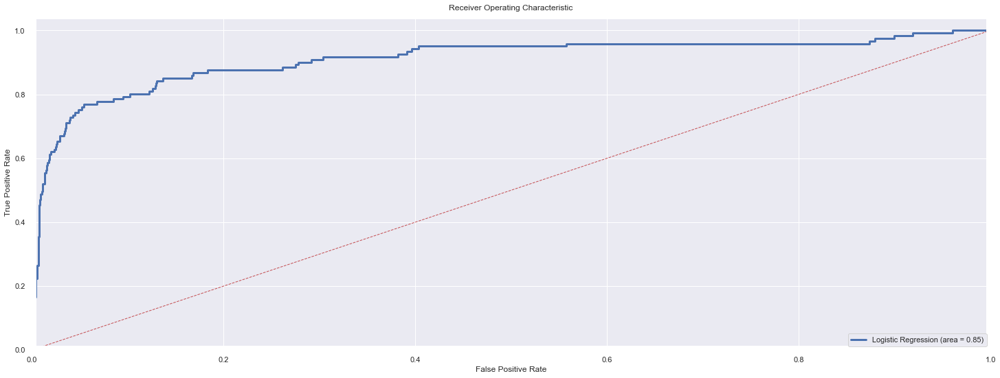

In [218]:
logit_roc_auc = metrics.roc_auc_score(y_test_lr, y_pred_lr)
y_pred_prob_log=classifier_lr.predict_proba(X_test_lr)
fpr, tpr, thresholds = metrics.roc_curve(y_test_lr, y_pred_prob_log[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc,lw=3)
plt.plot([0, 1], [0, 1],'r--',lw=1)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
# plt.savefig('Log_ROC')
plt.show()

PR (Precision-Recall Curve will be used as a metric for unbalanced classification)

No handles with labels found to put in legend.


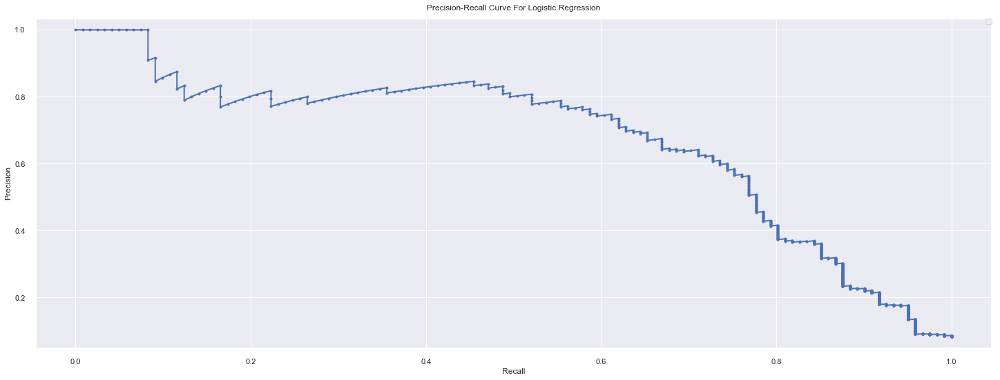

In [219]:
pr_curve(y_test_lr, y_pred_prob,'Precision-Recall Curve For Logistic Regression')

Calculate AUC score for Logistic Regression

In [220]:
precision, recall, _ = precision_recall_curve(y_test_lr, y_pred_prob.iloc[:,1])
auc_score_lr=auc(recall,precision)
print('AUC score for logistic regression is',auc_score_lr)

AUC score for logistic regression is 0.6719626854124502


RANDOM FOREST

Create subsets for Random Forest

In [221]:
X_train_rf=X_train.copy(deep=True)
y_train_rf=y_train.copy(deep=True)
X_test_rf=X_test.copy(deep=True)
y_test_rf=y_test.copy(deep=True)

In [222]:
from sklearn.ensemble import RandomForestClassifier
classifier_rf = RandomForestClassifier(n_estimators = 100) 

In [223]:
result_rf=classifier_rf.fit(X_train_rf, y_train_rf)

Stratified K-fold Cross validation

In [224]:
sk_folds = StratifiedKFold(n_splits = 10)
scores = cross_val_score(classifier_rf, X_train_rf, np.ravel(y_train_rf), cv = sk_folds,scoring='f1')
print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())

Cross Validation Scores:  [0.94915254 1.         0.98245614 0.96428571 1.         0.92063492
 0.93548387 1.         0.98245614 0.93103448]
Average CV Score:  0.9665503811721633


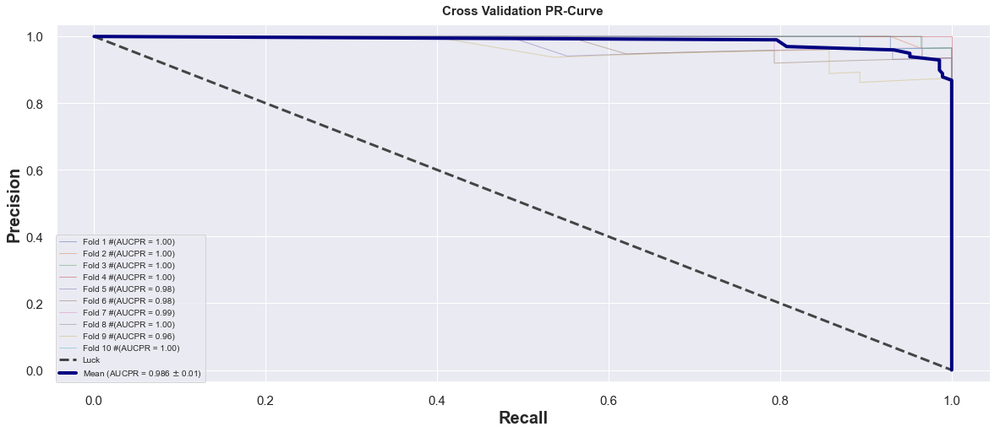

In [225]:
cross_validation_plot(X_train_rf, np.ravel(y_train_rf),classifier_rf, n_folds = 10)

Again we have increased confidense that the model can generalize.

Test the model

In [226]:
y_pred_rf = classifier_rf.predict(X_test_rf)

Get probabilities from random forest

In [227]:
y_pred_prob_rf = classifier_rf.predict_proba(X_test_rf)
#y_pred_prob_rf[:5,:]

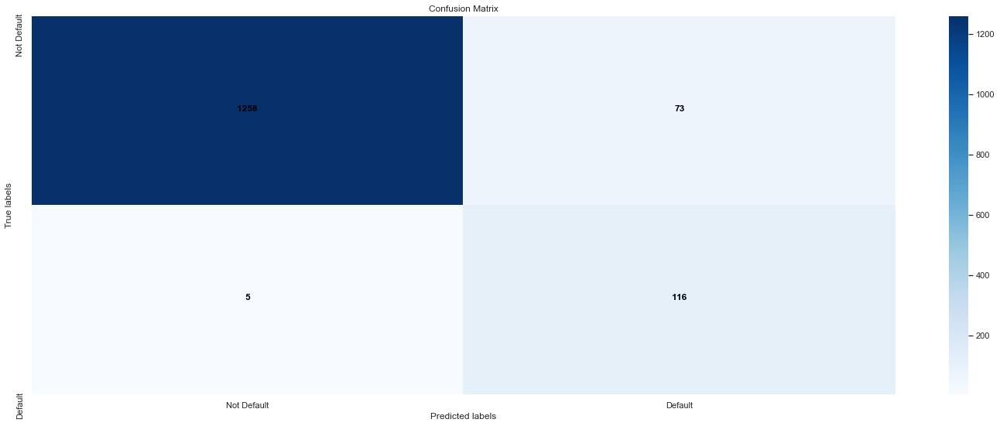

In [228]:
conf_matrix(y_test_rf,y_pred_rf)

In [229]:
print(classification_report(y_test_rf, y_pred_rf))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97      1331
           1       0.61      0.96      0.75       121

    accuracy                           0.95      1452
   macro avg       0.80      0.95      0.86      1452
weighted avg       0.96      0.95      0.95      1452



In [230]:
y_test_rf=pd.DataFrame(y_test_rf)
X_test_rf=pd.DataFrame(X_test_rf)
y_test_rf=y_test_rf.reset_index()
X_test_rf=X_test_lr.reset_index()
y_test_rf=y_test_rf.drop('index',axis=1)
X_test_rf=X_test_rf.drop('index',axis=1)

In [231]:
y_pred_prob_rf=pd.DataFrame(y_pred_prob_rf)
y_pred_prob_rf['class']=y_test_rf
y_pred_prob_rf.columns=['P(0)','P(1)','Class']

In [232]:
y_pred_prob_rf.head()

,P(0),P(1),Class
0,1.00,0.00,0
1,0.94,0.06,0
2,0.01,0.99,1
3,0.13,0.87,1
4,0.97,0.03,0


In [233]:
transition_matrix_rf=np.zeros((2,2))
transition_matrix_rf[0,0]=y_pred_prob_rf[y_pred_prob_rf['Class']==1].mean()[0]
transition_matrix_rf[0,1]=y_pred_prob_rf[y_pred_prob_rf['Class']==1].mean()[1]
transition_matrix_rf[1,0]=y_pred_prob_rf[y_pred_prob_rf['Class']==0].mean()[0]
transition_matrix_rf[1,1]=y_pred_prob_rf[y_pred_prob_rf['Class']==0].mean()[1]
transition_matrix_rf=pd.DataFrame(transition_matrix_rf)
transition_matrix_rf.columns=['No Default','Default']
transition_matrix_rf=transition_matrix_rf.rename(index={0: "Defaulter", 1: "Not Defaulter"})

In [234]:
transition_matrix_rf

,No Default,Default
Defaulter,0.105207,0.894793
Not Defaulter,0.927265,0.072735


Text(0.5, 0, 'Probability')

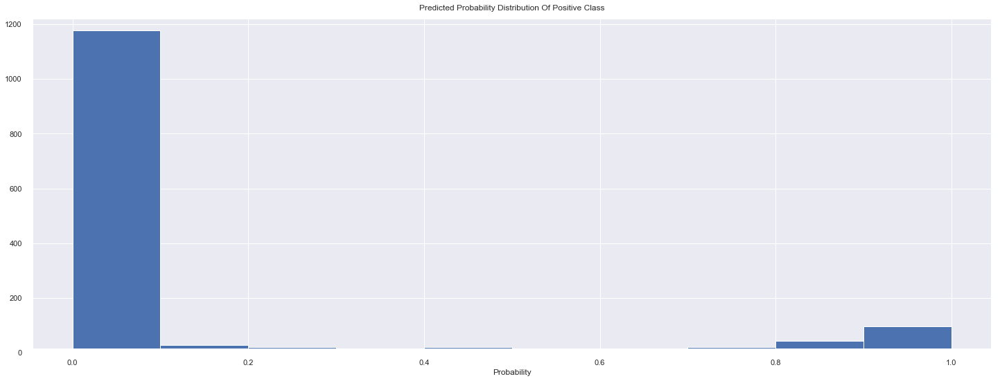

In [235]:
plt.hist(y_pred_prob_rf.iloc[:,1])
plt.title('Predicted Probability Distribution Of Positive Class')
plt.xlabel('Probability')

In [236]:
feature_imp = pd.Series(classifier_rf.feature_importances_,index = X_train_rf.columns).sort_values(ascending = False)
feature_imp.head()

avg_open_balance        0.296342
unpaid_ratio            0.250110
avg_delay               0.180617
avg_previous_unpaid     0.141175
ΔΙΑΣΤΗΜΑ ΣΥΝΕΡΓΑΣΙΑΣ    0.022831
dtype: float64

No handles with labels found to put in legend.


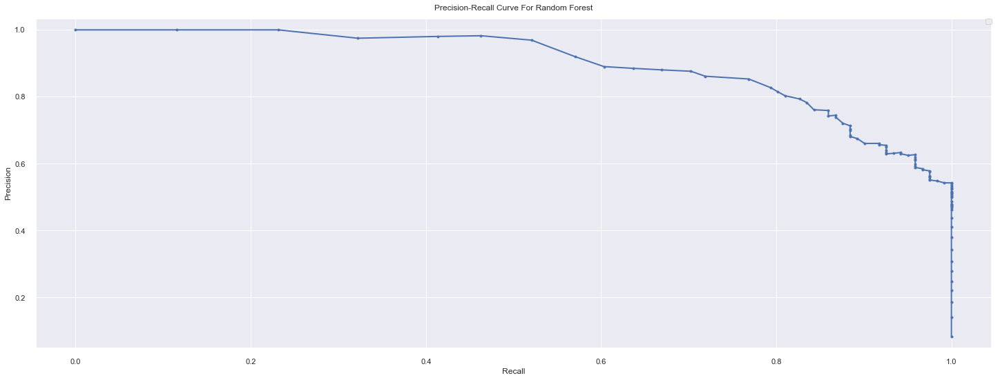

In [237]:
pr_curve(y_test_rf, y_pred_prob_rf,'Precision-Recall Curve For Random Forest')

In [238]:
precision_rf, recall_rf, _ = precision_recall_curve(y_test_rf, y_pred_prob_rf.iloc[:,1])
auc_score_rf=auc(recall_rf,precision_rf)
print('AUC score for Random Forest is',auc_score_rf)

AUC score for Random Forest is 0.8988984705961551


AUC ROC for Random Forest

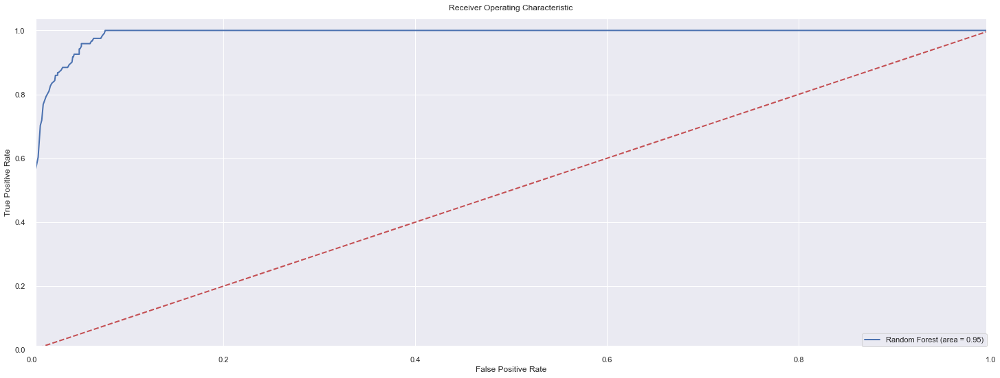

In [239]:
rf_roc_auc = metrics.roc_auc_score(y_test_rf, y_pred_rf)
y_pred_prob_rf=classifier_rf.predict_proba(X_test_rf)
fpr, tpr, thresholds = metrics.roc_curve(y_test_rf, y_pred_prob_rf[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Random Forest (area = %0.2f)' % rf_roc_auc,lw=2)
plt.plot([0, 1], [0, 1],'r--',lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
# plt.savefig('Log_ROC')
plt.show()

XGBOOST

Create subsets for XGBoost

In [240]:
X_train_xgb=X_train.copy(deep=True)
y_train_xgb=y_train.copy(deep=True)
X_test_xgb=X_test.copy(deep=True)
y_test_xgb=y_test.copy(deep=True)

In [241]:
cl_xgb = xgb.XGBClassifier(n_estimators=100)#,scale_pos_weight=2)
cl_xgb.fit(X_train_xgb,y_train_xgb)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

Cross validation

In [242]:
sk_folds = StratifiedKFold(n_splits = 10)
scores = cross_val_score(cl_xgb, X_train_xgb, np.ravel(y_train_xgb), cv = sk_folds,scoring='f1')
print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())

Cross Validation Scores:  [0.96551724 0.98181818 0.98245614 0.96296296 1.         0.93548387
 0.93548387 1.         0.98245614 1.        ]
Average CV Score:  0.9746178408797693


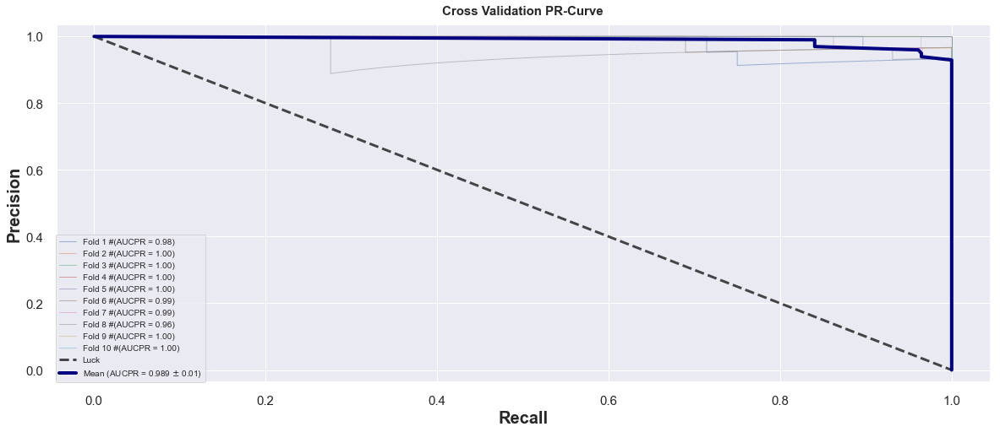

In [243]:
cross_validation_plot(X_train_xgb, np.ravel(y_train_xgb),cl_xgb, n_folds = 10)

Model is able to generalize

In [244]:
# Predict
y_pred_xgb = cl_xgb.predict(X_test_xgb)
y_pred_prob_xgb=cl_xgb.predict_proba(X_test_xgb)

In [245]:
cm=confusion_matrix(y_test_xgb,y_pred_xgb)
cm

array([[1274,   57],
       [   0,  121]], dtype=int64)

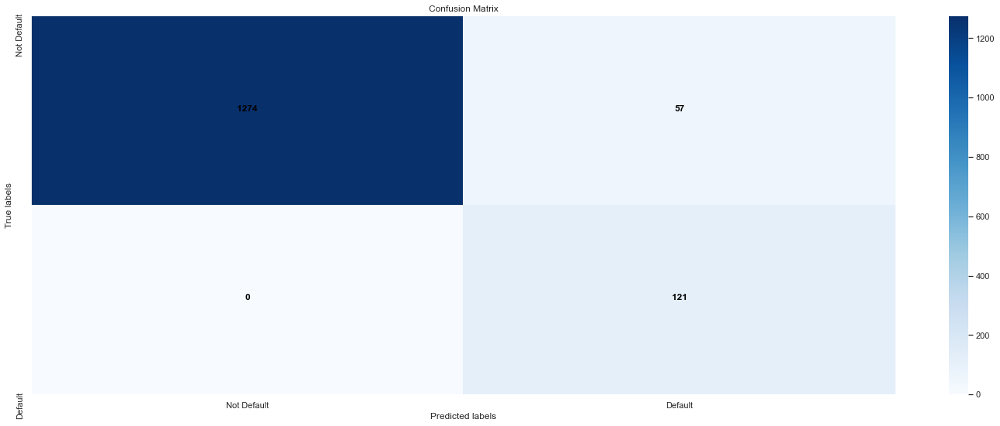

In [246]:
conf_matrix(y_test_xgb,y_pred_xgb)

In [247]:
print(classification_report(y_test_xgb, y_pred_xgb))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98      1331
           1       0.68      1.00      0.81       121

    accuracy                           0.96      1452
   macro avg       0.84      0.98      0.89      1452
weighted avg       0.97      0.96      0.96      1452



Get probabilities from XGBoost

In [248]:
y_test_xgb=pd.DataFrame(y_test_xgb)
X_test_xgb=pd.DataFrame(X_test_xgb)
y_test_xgb=y_test_xgb.reset_index()
X_test_xgb=X_test_xgb.reset_index()
y_test_xgb=y_test_xgb.drop('index',axis=1)
X_test_xgb=X_test_xgb.drop('index',axis=1)

In [249]:
y_pred_prob_xgb=pd.DataFrame(y_pred_prob_xgb)
y_pred_prob_xgb['Class']=y_test_xgb
#y_pred_prob_xgb.head(10)

In [250]:
transition_matrix_xgb=np.zeros((2,2))
transition_matrix_xgb[0,0]=y_pred_prob_xgb[y_pred_prob_xgb['Class']==1].mean()[0]
transition_matrix_xgb[0,1]=y_pred_prob_xgb[y_pred_prob_xgb['Class']==1].mean()[1]
transition_matrix_xgb[1,0]=y_pred_prob_xgb[y_pred_prob_xgb['Class']==0].mean()[0]
transition_matrix_xgb[1,1]=y_pred_prob_xgb[y_pred_prob_xgb['Class']==0].mean()[1]
transition_matrix_xgb=pd.DataFrame(transition_matrix_xgb)
transition_matrix_xgb.columns=['No Default','Default']
transition_matrix_xgb=transition_matrix_xgb.rename(index={0: "Defaulter", 1: "Not Defaulter"})

In [251]:
transition_matrix_xgb

,No Default,Default
Defaulter,0.020761,0.979239
Not Defaulter,0.954181,0.045818


Text(0.5, 0, 'Probability')

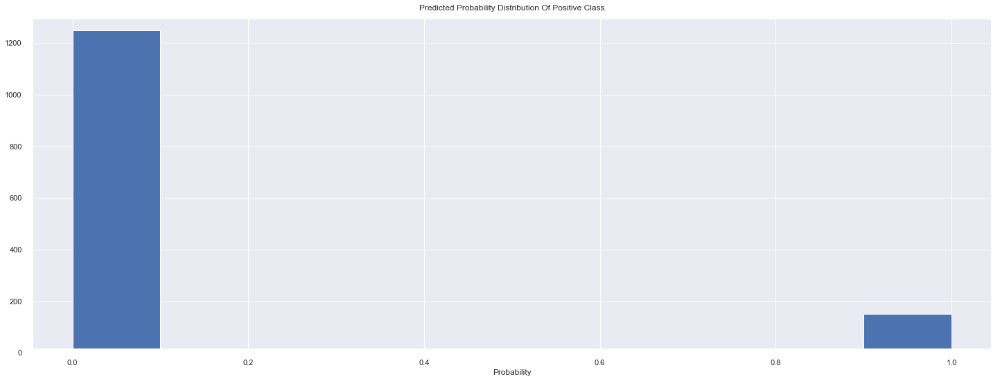

In [252]:
plt.hist(y_pred_prob_xgb.iloc[:,1])
plt.title('Predicted Probability Distribution Of Positive Class')
plt.xlabel('Probability')

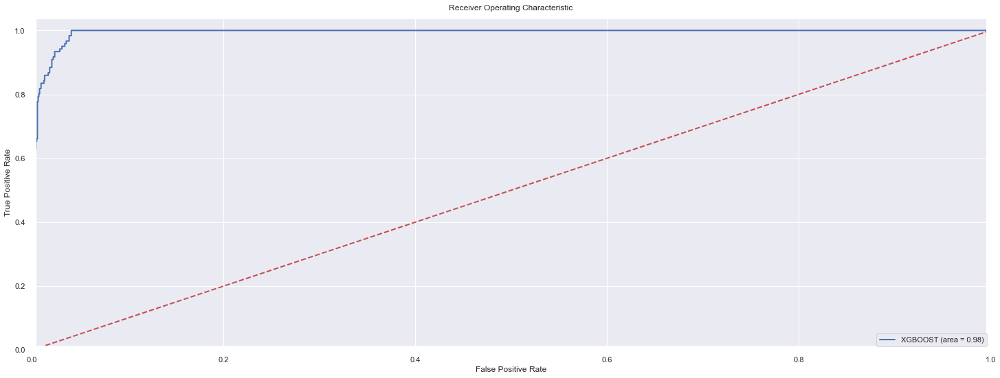

In [253]:
logit_roc_auc = metrics.roc_auc_score(y_test_xgb, y_pred_xgb)
y_pred_prob_log=cl_xgb.predict_proba(X_test_xgb)
fpr, tpr, thresholds = metrics.roc_curve(y_test_xgb, y_pred_prob_xgb.iloc[:,1])
plt.figure()
plt.plot(fpr, tpr, label='XGBOOST (area = %0.2f)' % logit_roc_auc,lw=2)
plt.plot([0, 1], [0, 1],'r--',lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
# plt.savefig('Log_ROC')
plt.show()

No handles with labels found to put in legend.


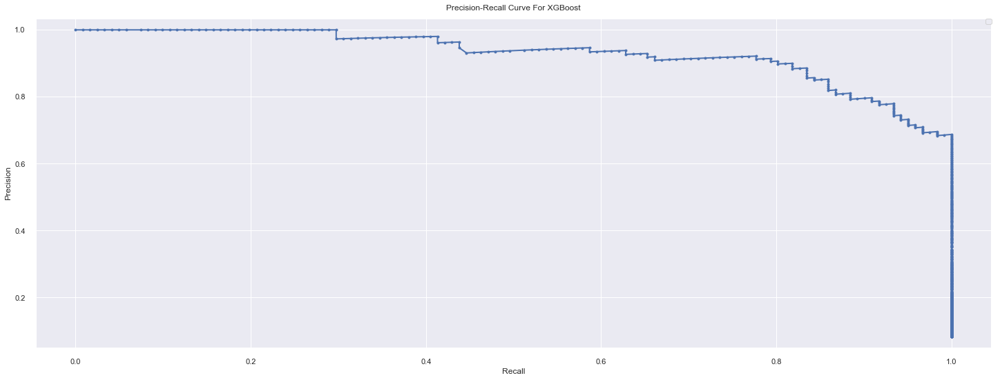

In [254]:
pr_curve(y_test_xgb,y_pred_prob_xgb,'Precision-Recall Curve For XGBoost')

In [255]:
print(cl_xgb.feature_importances_)
#X_train_xgb=X_train_xgb.drop(X_train_xgb.columns.difference(['avg_open_balance','avg_daily_cosumption','avg_night_consumption','avg_delay','avg_previous_unpaid','avg ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ','ΤΕΛΙΚΟΣ','unpaid_ratio','DTM2','ΔΙΑΣΤΗΜΑ ΣΥΝΕΡΓΑΣΙΑΣ']),1,inplace=True)
#X_test_xgb=X_test_xgb.drop(X_test_xgb.columns.difference(['avg_open_balance','avg_daily_cosumption','avg_night_consumption','avg_delay','avg_previous_unpaid','avg ΤΙΜΗ ΜΟΝΑΔΟΣ ΗΜΕΡΑΣ','ΤΕΛΙΚΟΣ','unpaid_ratio','DTM2','ΔΙΑΣΤΗΜΑ ΣΥΝΕΡΓΑΣΙΑΣ']),1,inplace=True)

[0.04275819 0.00760762 0.01455115 0.03101885 0.12997092 0.05245102
 0.591113   0.03590853 0.02926913 0.         0.         0.
 0.         0.         0.00096544 0.0448386  0.         0.01954756
 0.         0.         0.        ]


In [256]:
precision_xgb, recall_xgb, _ = precision_recall_curve(y_test_xgb, y_pred_prob_xgb.iloc[:,1])
auc_score_xgb=auc(recall_xgb,precision_xgb)
print('AUC score for XGBoost is',auc_score_xgb)

AUC score for XGBoost is 0.928633502340121


In [257]:
print(auc_score_lr,auc_score_rf)

0.6719626854124502 0.8988984705961551
